# **Breast Cancer Detection Disease**


## **Abstract**

The objective of this project is to diagnostically predict whether a patient is having breast cancer disease or not, based on certain diagnostic measurements included in the dataset.
The datasets consists of several medical predictor variables and one target variable, Class(**diagnosis**).


## **Column Description for our Dataset**


- **id:** Unique identifier for each patient or observation.
- **diagnosis:** The diagnosis of breast tissues.
 - M: Malignant - Indicates cancerous tumors.
 - B: Benign - Indicates non-cancerous tumors.

### **Kaggle Dataset Link:**  https://www.kaggle.com/datasets/yasserh/breast-cancer-dataset


## **Target Variable/Dependent Variable**
The datasets consists of several medical predictor variables and one target variable, **diagnosis** with classes such as M (malignant) or B (benign)

**Predictor variables includes** : All variables except for the diagnosis are predictor variables.

In [1]:
#Loading the required libraries
import numpy as np
import matplotlib as mlt
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import statsmodels.api as sd
from sklearn import tree
import sklearn.metrics as sm
import warnings
warnings.filterwarnings("ignore")

In [2]:
##Installing all the required libraries for the Assignment
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install fitter

import csv
import json
import logging
import optparse
import os
import random
import sys
import time
from datetime import datetime
from distutils.util import strtobool


import h2o
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import psutil
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.grid.grid_search import H2OGridSearch
from matplotlib.pyplot import figure

sns.set(rc={"figure.figsize": (16, 8)})

# Data Imputation
!pip install fancyimpute
from fancyimpute import IterativeImputer as MICE

# Model Interpretation
!pip install shap
import shap
from sklearn.model_selection import train_test_split

  Using cached fancyimpute-0.7.0.tar.gz (25 kB)
  Preparing metadata (setup.py) ... done
  Using cached knnimpute-0.1.0.tar.gz (8.3 kB)
  Preparing metadata (setup.py) ... done
  Using cached nose-1.3.7-py3-none-any.whl (154 kB)
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29881 sha256=70976123cc284a5060e3f4d5a0de9d5dda3f0d45f6b5dea56d71fcd3769be541
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11330 sha256=e8a8a225fe9dc2099ea7f4cc423416ab036a15dd945d985787318820302a711a
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 2.8 MB/s eta 0:00:00


# What question are you trying to answer? How did you frame it as an ML task?

- The objective here is to diagnostically predict whether a patient is having **Breast Cancer disease** or not, based on certain diagnostic measurements included in the dataset.
- Since the target variable **diagnosis** is binary with only two values ('M' or 'B'), we can train a binary classification model using supervised learning algorithms such as logistic regression, decision trees, random forests, or support vector machines.
- **Breast Cancer Disease** is a classification problem because it involves categorizing individuals based on the stage and severity of their disease.
- It is a progressive condition that can develop slowly over time, often with few or no symptoms until the disease is advanced.
- In my case, the model is being trained to learnrelationships between various medical parameters.
- Once the model is trained on certain portion of data it can be used to make predictions on new data, where it takes in the different medical parameters for an individual and outputs a prediction of whether or not they have the disease.

In [3]:
#Reading file
data = pd.read_csv(r"https://raw.githubusercontent.com/Somesh-Banerjee-neu/dataset/main/breast-cancer.csv")

## **Where did the feature data and label come from?**
- Breast cancer is the most common cancer amongst women in the world. It accounts for 25% of all cancer cases, and affected over 2.1 Million people in 2015 alone.
- It starts when cells in the breast begin to grow out of control.
- These cells usually form tumors that can be seen via X-ray or felt as lumps in the breast area.

**There are total 31 features**

 - 0   id                       
 - 1   diagnosis               
 - 2   radius_mean              
 - 3   texture_mean             
 - 4   perimeter_mean           
 - 5   area_mean                
 - 6   smoothness_mean          
 - 7   compactness_mean        
 - 8   concavity_mean           
 - 9   concave points_mean      
 - 10  symmetry_mean           
 - 11  fractal_dimension_mean   
 - 12  radius_se                
 - 13  texture_se               
 - 14  perimeter_se             
 - 15  area_se                  
 - 16  smoothness_se            
 - 17  compactness_se           
 - 18  concavity_se             
 - 19  concave points_se        
 - 20  symmetry_se              
 - 21  fractal_dimension_se     
 - 22  radius_worst             
 - 23  texture_worst            
 - 24  perimeter_worst         
 - 25  area_worst              
 - 26  smoothness_worst         
 - 27  compactness_worst       
 - 28  concavity_worst          
 - 29  concave points_worst     
 - 30  symmetry_worst           
 - 31  fractal_dimension_worst  



In [4]:
##Reading first 30 rows
data.head(30)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.71190,0.26540,0.4601,0.11890
1,842517,M,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.24160,0.18600,0.2750,0.08902
2,84300903,M,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.45040,0.24300,0.3613,0.08758
3,84348301,M,11.420,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.68690,0.25750,0.6638,0.17300
4,84358402,M,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.40000,0.16250,0.2364,0.07678
5,843786,M,12.450,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.53550,0.17410,0.3985,0.12440
6,844359,M,18.250,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.37840,0.19320,0.3063,0.08368
7,84458202,M,13.710,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.26780,0.15560,0.3196,0.11510
8,844981,M,13.000,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.53900,0.20600,0.4378,0.10720
9,84501001,M,12.460,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.10500,0.22100,0.4366,0.20750


In [5]:
# Checking Data Type of each variable
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [6]:
#Checking missing values in our data
data.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

### Observations:
- We have 0% missing values both in our independent variables as well as dependent variable

Text(0, 0.5, 'Diagnosis')

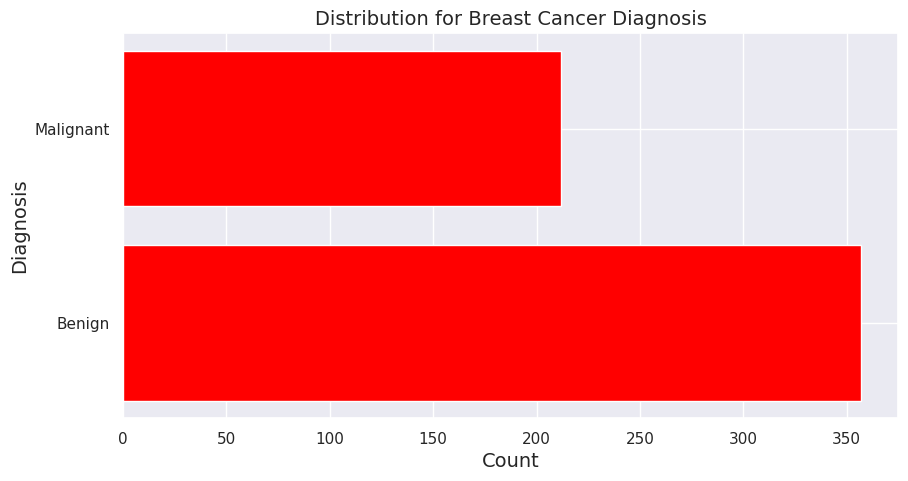

In [7]:
#Checking if diagnosis has only M and B (binary)
data['diagnosis'].value_counts()

#Plotting the distribution for Diagnosis
plt.figure(figsize=(10,5))
plt.barh(['Benign', 'Malignant'], data['diagnosis'].value_counts(), color ="#FF0000")
plt.title('Distribution for Breast Cancer Diagnosis', size =14)
plt.xlabel("Count", size =14)
plt.ylabel("Diagnosis", size =14)

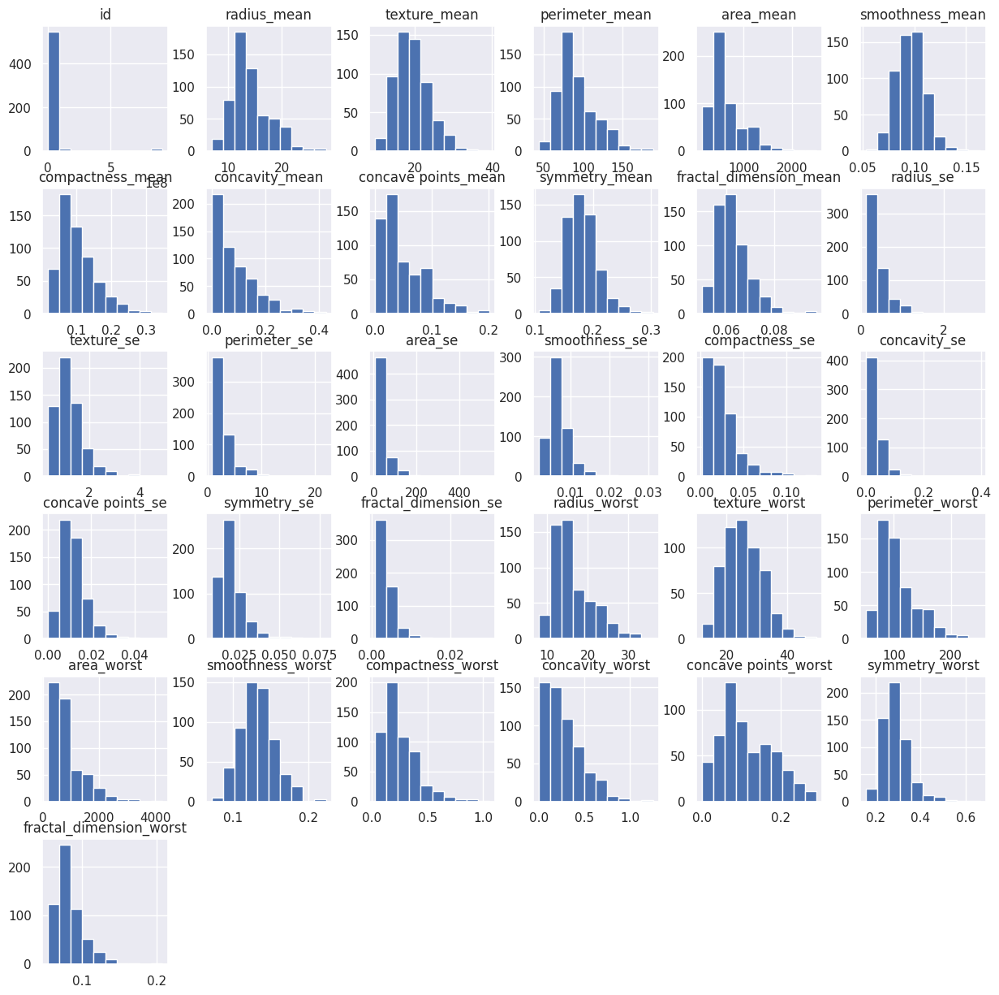

In [8]:
#generating histograms
plot = data.hist(figsize=(15,15))

Here I'm plotting histograms for each numerical column in the dataset. The hist() function in pandas is used to generate histograms for all numerical attributes in the breast cancer dataset

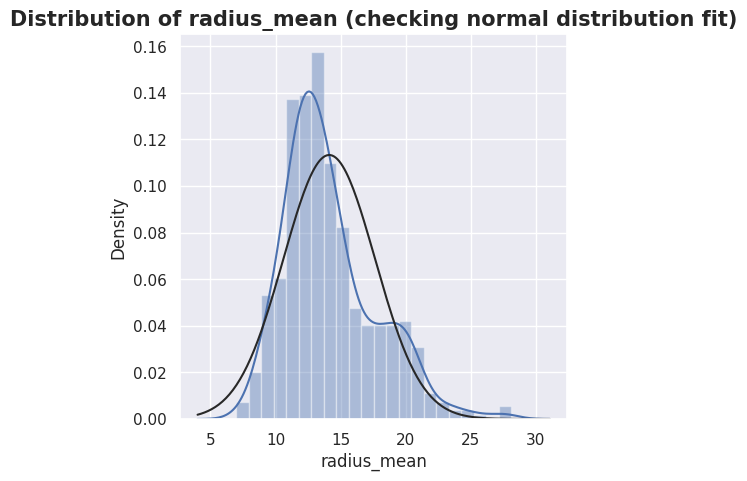

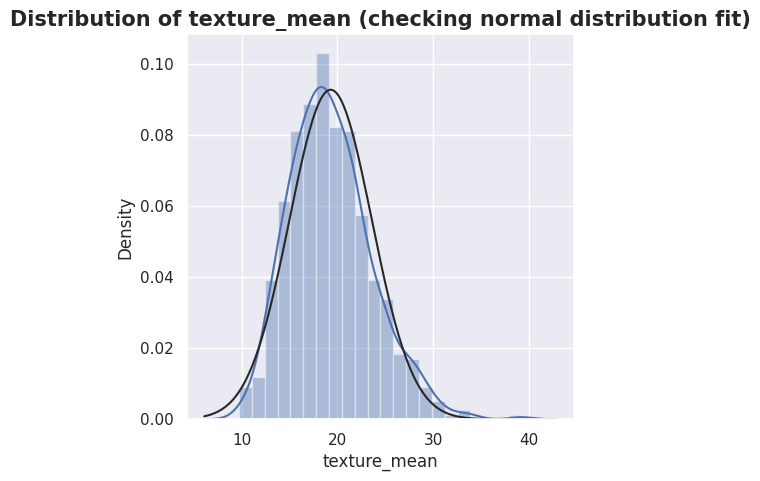

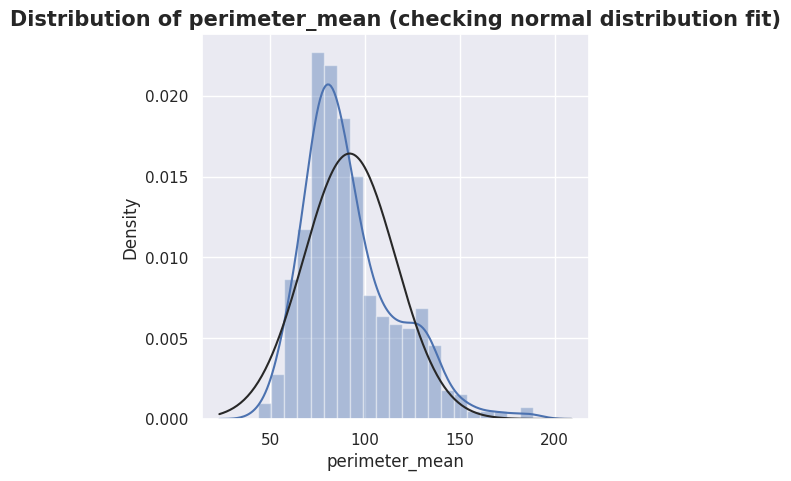

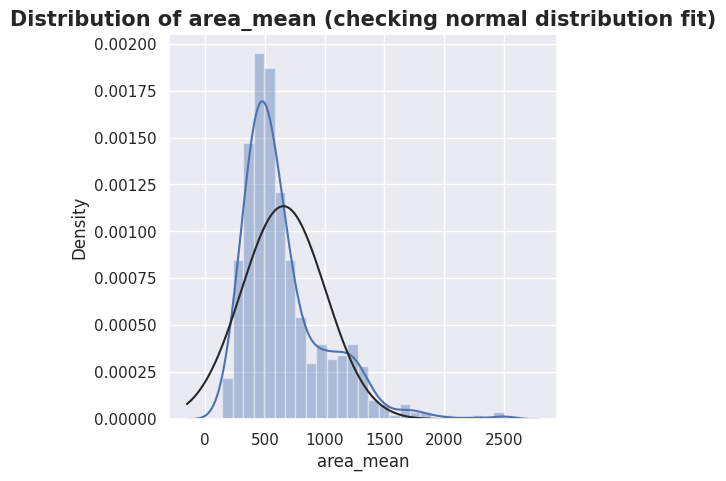

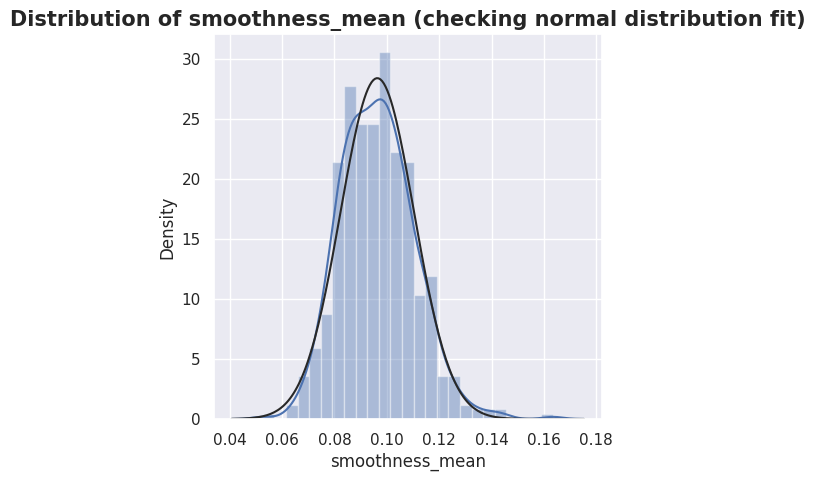

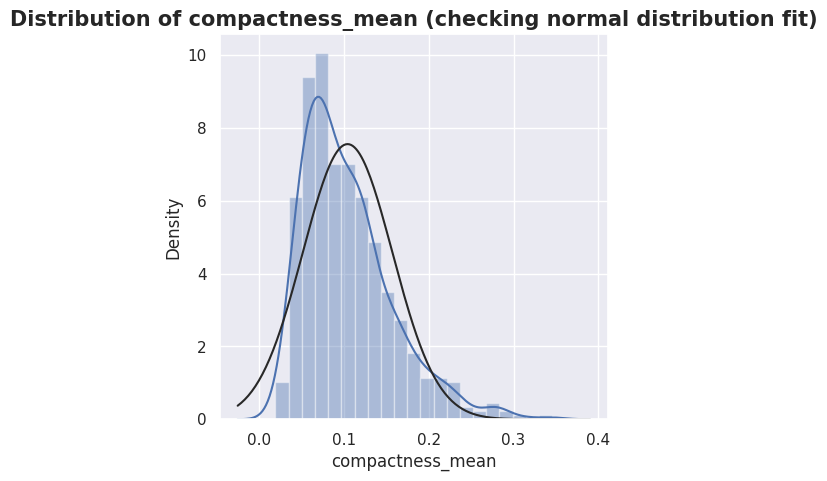

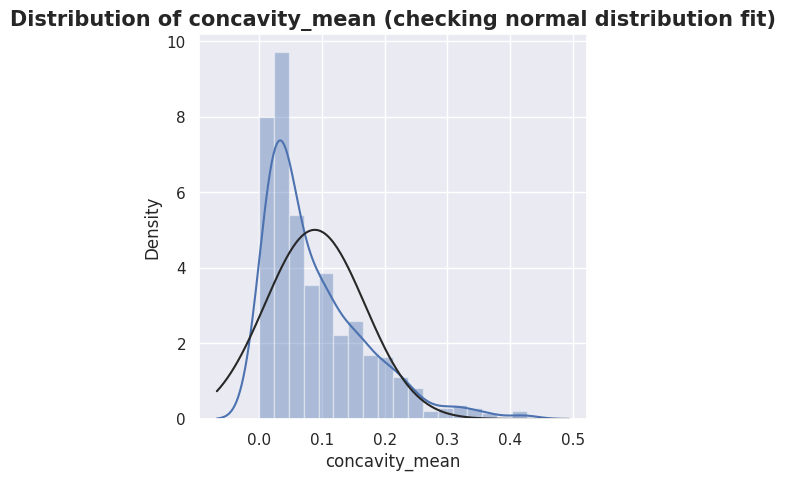

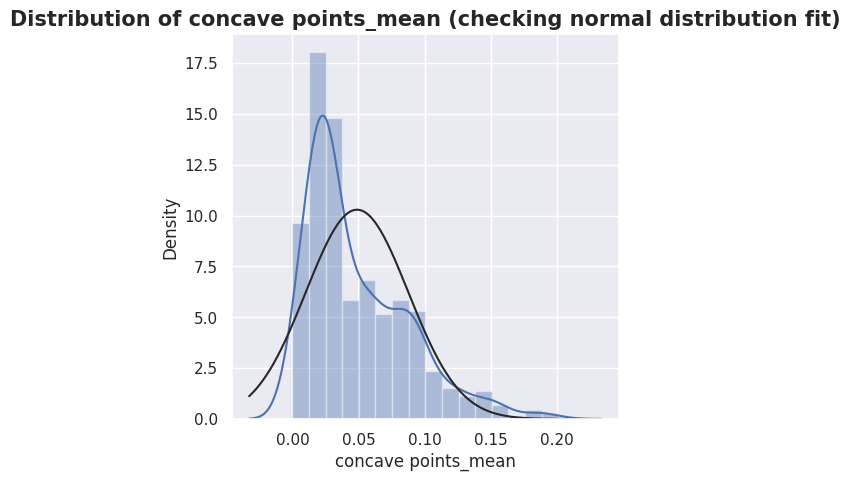

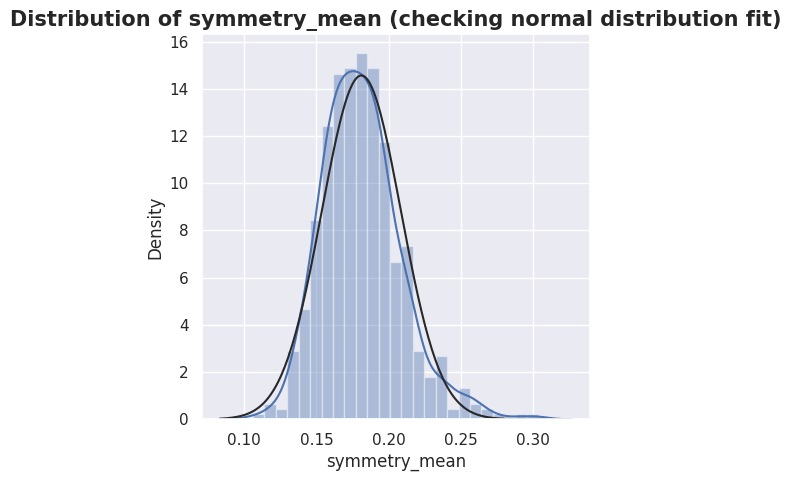

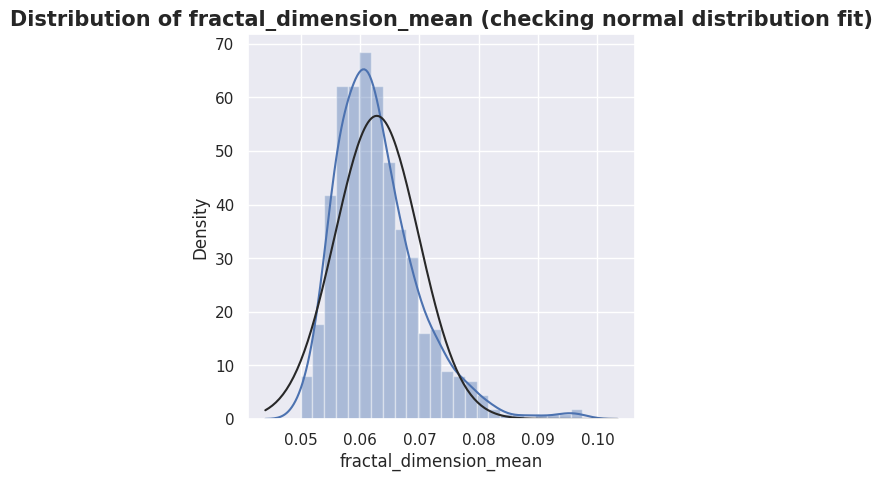

In [9]:
# Checking the distribution of independent(predictor) variables
datalist = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean',
            'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean',
            'fractal_dimension_mean']
for i in datalist:
    from scipy import stats
    plt.figure(figsize=(5,5))
    sns.distplot(data[i], fit=stats.norm)
    plt.title(f"Distribution of {i} (checking normal distribution fit)",
              size=15, weight="bold")

## **Observations from the graphs for the breast cancer dataset:**

- **radius_mean:** normal distribution with a bit of right-skewness
- **texture_mean:** normal distribution with a bit of right-skewness
- **perimeter_mean:** normal distribution with a bit of right-skewness
- **area_mean:** normal distribution with a bit of right-skewness
- **smoothness_mean:** normal distribution
- **compactness_mean:** normal distribution with right-skewness
- **concavity_mean:** almost normal distribution
- **concave point_mean:** almost normal distribution with right-skewness
- **symmetry_mean:** normal distribution with a bit of right-skewness
- **fractal_dimension mean:** normal distribution with a bit of right-skewness





In [10]:
#Dropping dependent valirable from dataframe to obtain the distributions of independent variables
datafinal = data.drop('diagnosis', axis=1)

<Axes: >

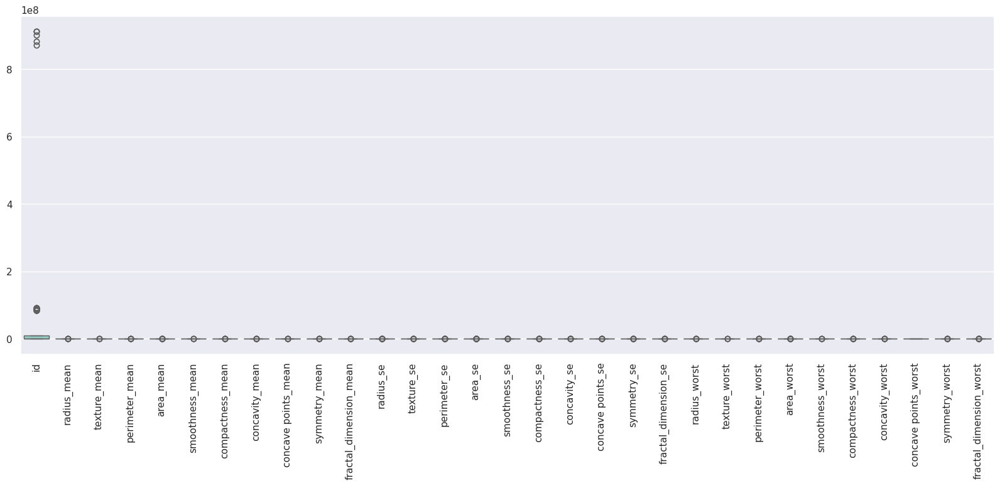

In [11]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,7))
plt.xticks(rotation=90)
sns.boxplot(data=datafinal, palette="Set3")

### **So what should be do next to visualize ranges of other predictor



We will plot the charts separately to get the ranges of each one of them

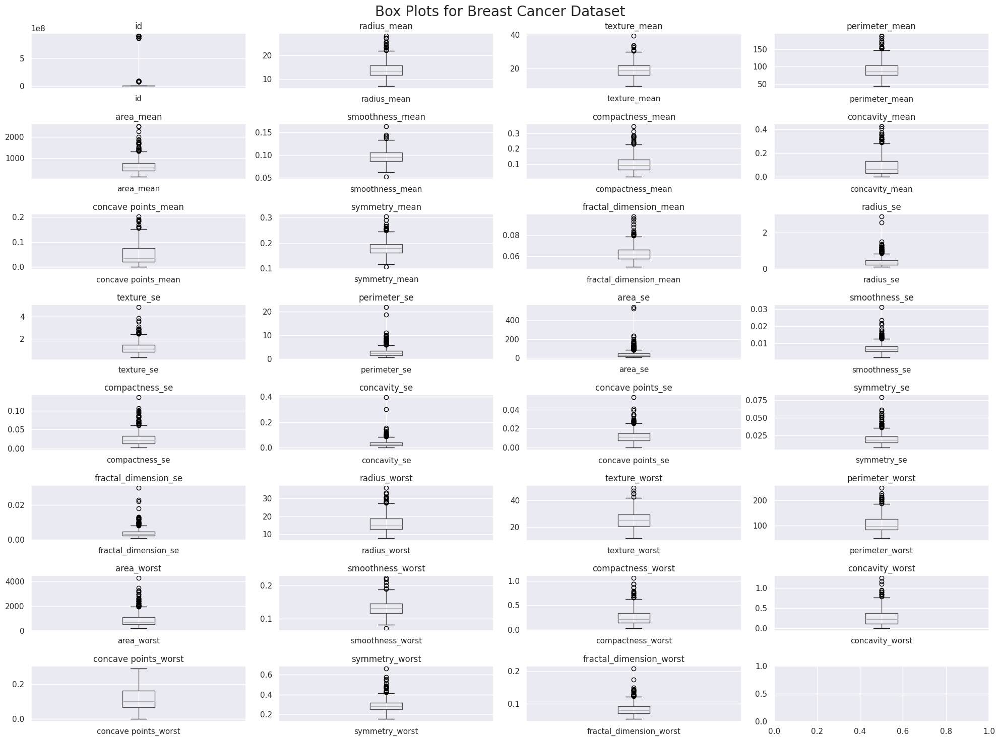

In [12]:
import matplotlib.pyplot as plt

# Create individual box plots for each numeric variable
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(20, 15))
fig.suptitle('Box Plots for Breast Cancer Dataset', fontsize=20)

for i, ax in enumerate(axes.flatten()):
    if i < len(datafinal.columns):
        datafinal.boxplot(column=datafinal.columns[i], ax=ax)
        ax.set_title(datafinal.columns[i])

plt.tight_layout()
plt.show()


In [13]:
datafinal.corr()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,-0.022114,...,0.082405,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866
radius_mean,0.074626,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.099770,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.073159,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.096893,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,-0.012968,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.000096,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.050080,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.044158,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,-0.022114,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413


The above function calculates the correlation coefficients for the columns of the DataFrame

### **Observations:**
1. From the plots, we do not have much high correlation between features.
2. Perimeter_se and Radius_se have 0.97 correlation value.
3. Also Radius_mean and Perimeter_mean have 0.97 correlation value.

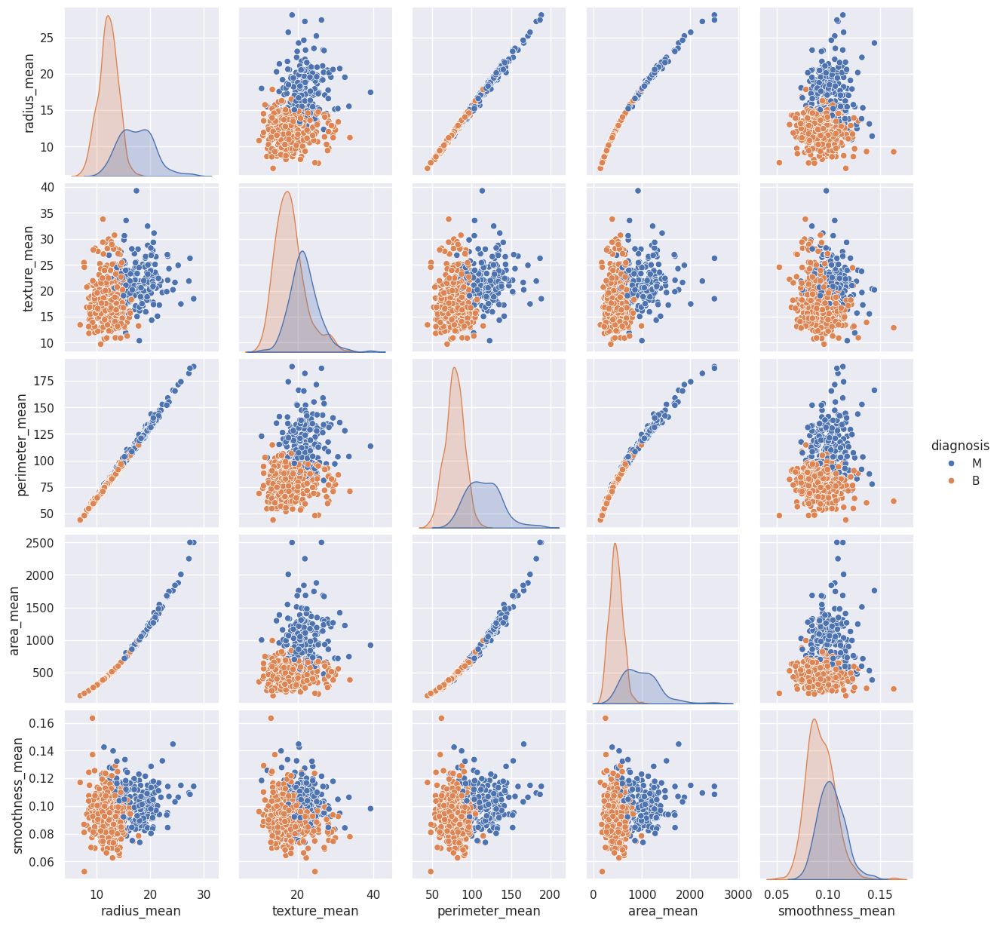

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

#pair plot to check the colinearity
selected_columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean']
sns.pairplot(data[selected_columns], hue='diagnosis')
plt.show()

## **What kind of data exploration did you do?**

#### First things first

__Data Type Evaluation__: Confirmed that all variables in the dataset are either integers or floats.
__Missing Value Assessment__: A thorough check revealed no missing values in any of the dataset's features.
__Data Distribution Analysis__: I examined the probability distribution for each feature in the training data, noting key observations.

__Correlation Analysis__: Utilized heatmaps and pair plots to assess correlations within the data, concluding that there are no significant multicollinearity issues.
__Histogram Review__: Created histograms for each numerical column to scrutinize the distributions of individual features.
__Bar Plot Analysis__: Conducted bar plot analyses to explore the influence of specific variables on disease prediction outcomes.


## **Data Cleaning**

- This dataset was relatively cleaner with no missing values. But handing missing values is one of the most important tasks in any Data Science project.
- I have performed various imputation techniques to acheive the same

## **How to handle missing data - Data Imputation techniques**

- Adding missing values to the original dataframe by randomly selecting a percentage of rows and columns (**1%, 5%, and 10%**) and replacing the values in those rows and columns with NaN.
 - Performing median and mode imputation of missing values
 - KNN Imputation
 - MICE Imputation

- In our dataset we dont have any mssing values, lets create some missing values

- After removing 1%, 5%, and 10% of the data, we'll implement these imputation techniques and assess their effectiveness in recovering the original data. This will help us understand the impact of each method on the accuracy of subsequent data analyses or predictive modeling.

In [15]:
diagnosis_mapping = {'M': 1.0, 'B': 0.0}
data['diagnosis'] = data['diagnosis'].map(diagnosis_mapping)

In [16]:
percent=[0.01,0.05,0.1]
train_data = data.astype(float)
cols=list(train_data.columns)
all_rows=[]
all_cols=[]
for per in percent:
    nan_rows_size=int(per*len(train_data))
    random_cols=np.random.choice(np.arange(len(cols)),nan_rows_size,replace=True)
    random_rows=np.random.choice(np.arange(len(train_data)),nan_rows_size,replace=False)
    all_rows.append(random_rows)
    all_cols.append(random_cols)

#creating new dataframe with 1%,5% and 10% missing values
predictors_missing_1_percent=train_data.copy()
for r_index,c_index in zip(all_rows[0],all_cols[0]):
    predictors_missing_1_percent.at[r_index,cols[c_index]]=np.NaN
predictors_missing_5_percent=train_data.copy()
for r_index,c_index in zip(all_rows[1],all_cols[1]):
    predictors_missing_5_percent.at[r_index,cols[c_index]]=np.NaN
predictors_missing_10_percent=train_data.copy()
for r_index,c_index in zip(all_rows[2],all_cols[2]):
    predictors_missing_10_percent.at[r_index,cols[c_index]]=np.NaN

In [17]:
#Printing missing values
print('Number of missing values')
print('1% missing',predictors_missing_1_percent.isna().sum().sum())
print('5% missing',predictors_missing_5_percent.isna().sum().sum())
print('10% missing',predictors_missing_10_percent.isna().sum().sum())
train_data.head(5)

Number of missing values
1% missing 5
5% missing 28
10% missing 56


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302.0,1.0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517.0,1.0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903.0,1.0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301.0,1.0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402.0,1.0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [26]:
# Dropping NaN value rows from our 1%, 5% and 10% missing values dataframe and creating new dataframes
df_1_percent_without_nan=predictors_missing_1_percent.dropna()
df_5_percent_without_nan=predictors_missing_5_percent.dropna()
df_10_percent_without_nan=predictors_missing_10_percent.dropna()
df_1_percent_without_nan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 564 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       564 non-null    float64
 1   diagnosis                564 non-null    float64
 2   radius_mean              564 non-null    float64
 3   texture_mean             564 non-null    float64
 4   perimeter_mean           564 non-null    float64
 5   area_mean                564 non-null    float64
 6   smoothness_mean          564 non-null    float64
 7   compactness_mean         564 non-null    float64
 8   concavity_mean           564 non-null    float64
 9   concave points_mean      564 non-null    float64
 10  symmetry_mean            564 non-null    float64
 11  fractal_dimension_mean   564 non-null    float64
 12  radius_se                564 non-null    float64
 13  texture_se               564 non-null    float64
 14  perimeter_se             564 no

In [27]:
# Importing the metrics library from sklearn
from sklearn import metrics as sm

# Defining the function to calculate model performance scores
def performnce_calcuation(y_true,y_pred):
    acc=sm.accuracy_score(y_true,y_pred)
    log_loss=sm.log_loss(y_true,y_pred)
    auc=sm.roc_auc_score(y_true,y_pred)
    confusion_matrix=sm.confusion_matrix(y_true,y_pred)
    return acc,auc,log_loss,confusion_matrix

In [28]:
num_cols = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

cat_cols = ['diagnosis']

predict_impute_1 = pd.DataFrame()
predict_impute_5 = pd.DataFrame()
predict_impute_10 = pd.DataFrame()

# Imputing numerical columns with median
for col in num_cols:
    predict_impute_1[col] = predictors_missing_1_percent[col].fillna(predictors_missing_1_percent[col].median())
    predict_impute_5[col] = predictors_missing_5_percent[col].fillna(predictors_missing_5_percent[col].median())
    predict_impute_10[col] = predictors_missing_10_percent[col].fillna(predictors_missing_10_percent[col].median())

# Imputing categorical columns with mode
for col in cat_cols:
    predict_impute_1[col] = predictors_missing_1_percent[col].fillna(predictors_missing_1_percent[col].mode().iloc[0])
    predict_impute_5[col] = predictors_missing_5_percent[col].fillna(predictors_missing_5_percent[col].mode().iloc[0])
    predict_impute_10[col] = predictors_missing_10_percent[col].fillna(predictors_missing_10_percent[col].mode().iloc[0])

# **Imputation Method 1 : Impute using KNN imputer**

In [29]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)

# For 1% imputed data
predictors = predict_impute_1.drop('diagnosis', axis=1)
all_col = list(predictors.columns)
final = imputer.fit_transform(predictors)
imputed_df_1 = pd.DataFrame(final, columns=all_col)
imputed_df_1['diagnosis'] = predict_impute_1['diagnosis'].values  # appending the target column back

# For 5% imputed data
predictors = predict_impute_5.drop('diagnosis', axis=1)
all_col = list(predictors.columns)
final = imputer.fit_transform(predictors)
imputed_df_5 = pd.DataFrame(final, columns=all_col)
imputed_df_5['diagnosis'] = predict_impute_5['diagnosis'].values  # appending the target column back

# For 10% imputed data
predictors = predict_impute_10.drop('diagnosis', axis=1)
all_col = list(predictors.columns)
final = imputer.fit_transform(predictors)
imputed_df_10 = pd.DataFrame(final, columns=all_col)
imputed_df_10['diagnosis'] = predict_impute_10['diagnosis'].values  # appending the target column back


In [30]:
from sklearn import tree
from sklearn.model_selection import train_test_split

model_1 = tree.DecisionTreeClassifier(random_state=42, max_depth=2)

# For 1% imputed data
predictors = predict_impute_1.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_1['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_1_te, auc_1_te, log_loss_1_te, cm_1_te = performnce_calcuation(y_test, model_1.predict(X_test))

# For 5% imputed data
predictors = predict_impute_5.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_5['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_2_te, auc_2_te, log_loss_2_te, cm_2_te = performnce_calcuation(y_test, model_1.predict(X_test))

# For 10% imputed data
predictors = predict_impute_10.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_10['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_3_te, auc_3_te, log_loss_3_te, cm_3_te = performnce_calcuation(y_test, model_1.predict(X_test))




In [31]:
print("-------------------------------")
print(f'For 1% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_1_te:.2f}')
print(f'AUC: {auc_1_te:.2f}')
print(f'Log Loss: {log_loss_1_te:.2f}')
print(f'Confusion Matrix:\n {cm_1_te}')
print("\n-------------------------------")
print(f'For 5% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_2_te:.2f}')
print(f'AUC: {auc_2_te:.2f}')
print(f'Log Loss: {log_loss_2_te:.2f}')
print(f'Confusion Matrix:\n {cm_2_te}')
print("\n-------------------------------")
print(f'For 10% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_3_te:.2f}')
print(f'AUC: {auc_3_te:.2f}')
print(f'Log Loss: {log_loss_3_te:.2f}')
print(f'Confusion Matrix:\n {cm_3_te}')
print("\n-------------------------------")

-------------------------------
For 1% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.93
Log Loss: 2.77
Confusion Matrix:
 [[81  8]
 [ 3 51]]

-------------------------------
For 5% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.93
Log Loss: 2.77
Confusion Matrix:
 [[81  8]
 [ 3 51]]

-------------------------------
For 10% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.93
Log Loss: 2.77
Confusion Matrix:
 [[81  8]
 [ 3 51]]

-------------------------------


#  **Imputation Method 2 : MICE Imputation technique**


In [32]:
!pip install fancyimpute
#from sklearn.impute import IterativeImputer
from fancyimpute import IterativeImputer as MICE
import pandas as pd


# create a copy of the original dataframe with missing values
df_missing = predictors
df_missing.iloc[2:5,3:6] = np.nan

# create an imputer object
imputer = MICE()

# fit the imputer on the data
imputer.fit(predictors)

#MICE().fit_transform(df)


# perform the imputation
df_imputed = imputer.transform(predictors)

predictors=predict_impute_1.drop('diagnosis',axis=1)
all_col=list(predictors.columns)
final=imputer.fit_transform(predictors)
imputed_df_1=pd.DataFrame(final,columns=all_col)

predictors=predict_impute_5.drop('diagnosis',axis=1)
all_col=list(predictors.columns)
final=imputer.fit_transform(predictors)
imputed_df_5=pd.DataFrame(final,columns=all_col)

predictors=predict_impute_10.drop('diagnosis',axis=1)
all_col=list(predictors.columns)
final=imputer.fit_transform(predictors)
imputed_df_10=pd.DataFrame(final,columns=all_col)


In [33]:
model_1=tree.DecisionTreeClassifier(random_state=42,max_depth=4)

predictors=df_1_percent_without_nan.drop('diagnosis',axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, df_1_percent_without_nan['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train,y_train)

accuracy_1_te,auc_1_te,log_loss_1_te,cm_1_te=performnce_calcuation(y_test,model_1.predict(X_test))

predictors=df_5_percent_without_nan.drop('diagnosis',axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, df_5_percent_without_nan['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train,y_train)

accuracy_2_te,auc_2_te,log_loss_2_te,cm_2_te=performnce_calcuation(y_test,model_1.predict(X_test))

predictors=df_10_percent_without_nan.drop('diagnosis',axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, df_10_percent_without_nan['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train,y_train)

accuracy_3_te,auc_3_te,log_loss_3_te,cm_3_te=performnce_calcuation(y_test,model_1.predict(X_test))


In [35]:
print("-------------------------------")
print(f'For 1% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_1_te:.2f}')
print(f'AUC: {auc_1_te:.2f}')
print(f'Log Loss: {log_loss_1_te:.2f}')
print(f'Confusion Matrix:\n {cm_1_te}')
print("\n-------------------------------")
print(f'For 5% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_2_te:.2f}')
print(f'AUC: {auc_2_te:.2f}')
print(f'Log Loss: {log_loss_2_te:.2f}')
print(f'Confusion Matrix:\n {cm_2_te}')
print("\n-------------------------------")
print(f'For 10% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_3_te:.2f}')
print(f'AUC: {auc_3_te:.2f}')
print(f'Log Loss: {log_loss_3_te:.2f}')
print(f'Confusion Matrix:\n {cm_3_te}')
print("\n-------------------------------")

-------------------------------
For 1% Imputation Dataset
-------------------------------
Accuracy: 0.94
AUC: 0.95
Log Loss: 2.05
Confusion Matrix:
 [[74  7]
 [ 1 59]]

-------------------------------
For 5% Imputation Dataset
-------------------------------
Accuracy: 0.93
AUC: 0.91
Log Loss: 2.39
Confusion Matrix:
 [[91  3]
 [ 6 36]]

-------------------------------
For 10% Imputation Dataset
-------------------------------
Accuracy: 0.91
AUC: 0.91
Log Loss: 3.07
Confusion Matrix:
 [[66  5]
 [ 6 52]]

-------------------------------


# **Interpreting the Imputation Methods**

Here are some conclusions that can be drawn from the the aboveresults:



- __KNN imputation:__ The model's accuracy dropped after introducing a 1% imputation rate, but it then improved as the imputation rate increased to 5% and 10%. This pattern indicates that KNN imputation might not reliably enhance model performance, possibly due to the imputed values not accurately capturing the true data patterns.

- __MICE (Multivariate Imputation by Chained Equations) technique:__ Following a decline in accuracy at a 1% imputation rate, there was a notable improvement after 10% imputation. This improvement suggests that the MICE method, which involves Multivariate Imputation by Chained Equations, could be superior to methods like median, mode, or KNN imputation, particularly as the amount of imputed data increases.

- Across all tested imputation methods, the accuracy remained below that of the base model. This observation implies that despite imputation efforts, the inherent loss of information due to missing data might not be completely recoverable, and the imputed values might not fully replicate the original data patterns.

In essence, the effectiveness of different imputation strategies and the extent of data imputation play crucial roles in influencing the accuracy of a model.




# **Feature Importance and Selection**

- Lets fit a very simple linear model to understand how the predictor variable are impacting

### **Normalization**

In [36]:
from sklearn import preprocessing
import pandas as pd

# Assuming 'data' is your breast cancer dataset, and you want to normalize specific columns
columns_to_normalize = [
    'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean',
    'radius_se', 'texture_se', 'perimeter_se', 'area_se',
    'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se',
    'symmetry_se', 'fractal_dimension_se',
    'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst',
    'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst'
]

# Create x to store scaled values as floats
x = datafinal[columns_to_normalize].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Replace the original columns with normalized values in the DataFrame
datafinal[columns_to_normalize] = pd.DataFrame(x_scaled)



In [37]:
#data after noromalizing and feature creation
datafinal.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,0.338222,0.323965,0.332935,0.216920,0.394785,0.260601,0.208058,0.243137,0.379605,...,0.296663,0.363998,0.283138,0.170906,0.404138,0.220212,0.217403,0.393836,0.263307,0.189596
std,1.250206e+08,0.166787,0.145453,0.167915,0.149274,0.126967,0.161992,0.186785,0.192857,0.138456,...,0.171940,0.163813,0.167352,0.139932,0.150779,0.152649,0.166633,0.225884,0.121954,0.118466
min,8.670000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.692180e+05,0.223342,0.218465,0.216847,0.117413,0.304595,0.139685,0.069260,0.100944,0.282323,...,0.180719,0.241471,0.167837,0.081130,0.300007,0.116337,0.091454,0.223127,0.185098,0.107700
50%,9.060240e+05,0.302381,0.308759,0.293345,0.172895,0.390358,0.224679,0.144189,0.166501,0.369697,...,0.250445,0.356876,0.235320,0.123206,0.397081,0.179110,0.181070,0.343402,0.247782,0.163977
75%,8.813129e+06,0.416442,0.408860,0.416765,0.271135,0.475490,0.340531,0.306232,0.367793,0.453030,...,0.386339,0.471748,0.373475,0.220901,0.494156,0.302520,0.305831,0.554639,0.318155,0.242949
max,9.113205e+08,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## **Observations:**
We can see that the numerical variables are now in the range of 0 to 1

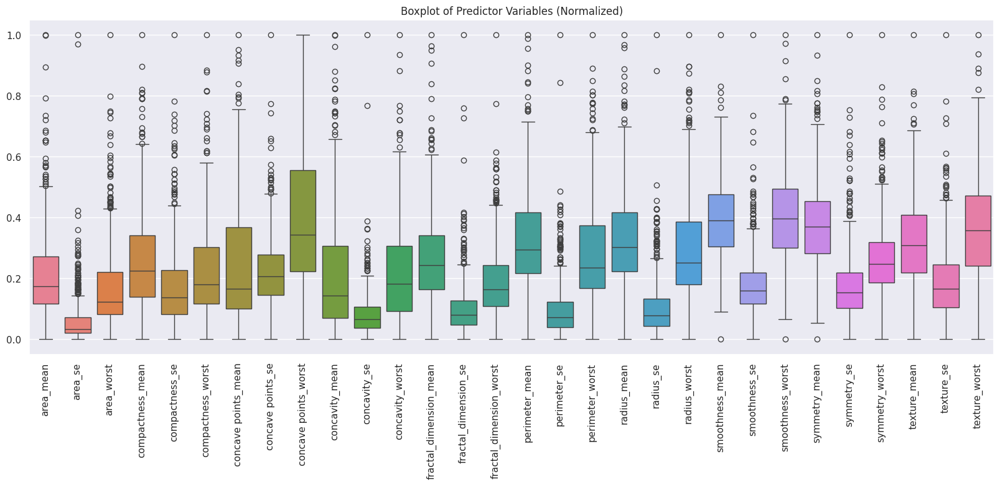

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and set its size
plt.figure(figsize=(20, 7))

# Assuming 'datafinal' is your breast cancer dataset
# Exclude the 'id' column (if you don't want to plot it)
columns_to_plot = datafinal.columns.difference(['id'])

# Create a boxplot for the remaining columns
sns.boxplot(data=datafinal[columns_to_plot])

# Set the plot title
plt.title("Boxplot of Predictor Variables (Normalized)")

# Rotate x-axis labels for better visibility (optional)
plt.xticks(rotation=90)

# Show the plot
plt.show()

## **Observations:**



Nearly all variables have outliers

In [39]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients

df = data.drop(["diagnosis"], axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat([df_norm, data['diagnosis']], axis=1)

In [40]:
print(df_norm.columns)

Index(['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'diagnosis'],
      dtype='object')


In [41]:
import statsmodels.formula.api as smf  # OLS model Library
df_norm.columns = [col.replace(' ', '_') for col in df_norm.columns]

# Adjust the formula to include the features from your breast cancer dataset
results = smf.ols(
    "diagnosis ~ radius_mean + texture_mean + perimeter_mean + area_mean + smoothness_mean + compactness_mean + concavity_mean + concave_points_mean + symmetry_mean + fractal_dimension_mean + radius_se + texture_se + perimeter_se + area_se + smoothness_se + compactness_se + concavity_se + concave_points_se + symmetry_se + fractal_dimension_se + radius_worst + texture_worst + perimeter_worst + area_worst + smoothness_worst + compactness_worst + concavity_worst + concave_points_worst + symmetry_worst + fractal_dimension_worst",
    data=df_norm
).fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:              diagnosis   R-squared:                       0.774
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                     61.53
Date:                Fri, 26 Apr 2024   Prob (F-statistic):          6.05e-153
Time:                        05:17:38   Log-Likelihood:                 29.650
No. Observations:                 569   AIC:                             2.699
Df Residuals:                     538   BIC:                             137.4
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

p value is greater that 0.05 - feature is not significant for predicting the target variable
p value is less than 0.05 - feature is significant for predicting the target variable

## **Observations:**

Summary of the p-values for each predictor variable in your regression results:
- The Intercept shows a p-value of 0.000, clearly under the threshold of 0.05, marking it as a statistically significant predictor.
- The p-value for radius_mean is 0.210, exceeding the 0.05 significance level, which suggests it does not significantly influence the model.
texture_mean recorded a p-value of 0.567, indicating a lack of statistical significance.
- perimeter_mean follows with a p-value of 0.345, also indicating non-significance.
- area_mean has a p-value of 0.545, further confirming its non-significance in the model.
- smoothness_mean exhibits a p-value of 0.967, indicating it does not contribute significantly.
compactness_mean, with a p-value of 0.002, is identified as a significant predictor.
- The p-value for concavity_mean stands at 0.182, suggesting it isn't a significant factor.
- concave_points_mean has a p-value of 0.280, also above the threshold for significance.
- symmetry_mean, with a p-value of 0.890, is not statistically significant.
fractal_dimension_mean shows a p-value of 0.995, indicating it does not significantly affect the model.
- radius_se has a p-value of 0.162, denoting non-significance.
texture_se recorded a p-value of 0.855, highlighting its lack of impact.
perimeter_se with a p-value of 0.584 is another non-significant feature.
area_se has a p-value of 0.509, lacking significance.
- smoothness_se, however, is significant with a p-value of 0.017.
- compactness_se shows a p-value of 0.976, indicating its non-significance.
- concavity_se is considered significant with a p-value of 0.006.
- concave_points_se has a p-value of 0.053, barely missing the significance mark.
- symmetry_se and fractal_dimension_se have p-values of 0.534 and 0.541 respectively, marking them as non-significant.
- radius_worst is a significant variable with a p-value of 0.001.
- texture_worst records a p-value of 0.303, indicating its non-significance.
- perimeter_worst, with a p-value of 0.682, shows no significant impact.
- area_worst is statistically significant, having a p-value of 0.002.
- smoothness_worst has a p-value of 0.705, indicating it is not a significant predictor.
- compactness_worst, with a p-value of 0.861, also lacks significance.
concavity_worst has a p-value of 0.156, suggesting it does not significantly affect the outcome.
- concave_points_worst and symmetry_worst have p-values of 0.612 and 0.260 respectively, indicating they are not significant predictors.
- fractal_dimension_worst with a p-value of 0.072 is also above the significance level.


Lets consider only these features and calculate the model fit again, and then lets have a comparative analysis of both models.

In [42]:
df_norm_feature_selected = df_norm[
    [
        'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'diagnosis'  # Include 'diagnosis'
    ]
]

results2 = smf.ols(
    "diagnosis ~ radius_mean + texture_mean + perimeter_mean + area_mean",
    data=df_norm_feature_selected,
).fit()

print(results2.summary())  # OLS Linear Model Summary

                            OLS Regression Results                            
Dep. Variable:              diagnosis   R-squared:                       0.618
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                     228.2
Date:                Fri, 26 Apr 2024   Prob (F-statistic):          2.31e-116
Time:                        05:23:58   Log-Likelihood:                -120.04
No. Observations:                 569   AIC:                             250.1
Df Residuals:                     564   BIC:                             271.8
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -0.5859      0.056    -10.

In [43]:
predicted_diagnosis = results2.predict(
    df_norm[
        ["radius_mean", "texture_mean", "perimeter_mean", "area_mean","diagnosis"]
    ]
)

df_norm["predicted_diagnosis"] = predicted_diagnosis.round()

In [44]:
predicted_disease_2 = results2.predict(
    df_norm_feature_selected[
        ["radius_mean", "texture_mean", "perimeter_mean", "area_mean"]
    ]
)

df_norm_feature_selected["predicted_disease_2"] = predicted_disease_2.round()

In [45]:
# Function to calculate how well the data has been recovered after performing data imputation
def percentage_change(l1, l2):
    percent_change = abs(l2 - l1) / (l1 + 0.000000001)
    avg_change = (percent_change.sum() / percent_change.count()) * 100
    return avg_change

In [46]:
def percentage_change(original, predicted):
    # Assuming this function calculates the percentage of incorrect predictions
    # You should define this function based on your specific needs
    return ((original != predicted).sum() / len(original)) * 100

print(
    "Accuracy of predicting Breast Cancer using all features = ",
    100 - percentage_change(df_norm["diagnosis"], df_norm["predicted_diagnosis"]),
)
print(
    "Accuracy of predicting Breast Cancer using only selected features = ",
    100 - percentage_change(
        df_norm_feature_selected["diagnosis"],
        df_norm_feature_selected["predicted_disease_2"],
    ),
)

Accuracy of predicting Breast Cancer using all features =  89.63093145869948
Accuracy of predicting Breast Cancer using only selected features =  89.63093145869948


## **Observations:**


From the above two interpretations, our observation is that in both the cases our model predicts the chances of person affecting with Breast Cancer Disease very good and they are same to each other i.e **89.61%**

From the above studies let's stick to the data with all featues and try using different models

In [47]:
df_norm = df_norm.drop(["predicted_diagnosis"], axis=1)

In [48]:
X = df_norm.drop(["diagnosis"], axis=1)  # Training Features
Y = df_norm["diagnosis"]  # Target


# **How did you split the data into train, and test?**
- Here I have split the data into training and test data i

In [49]:
 import shap

 # Splitting Data into Training and Test
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(
    X, Y, test_size=0.1, random_state=42
)
  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_train_100 = shap.utils.sample(
    x_train, 100
)
# Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)


# Fitting Linear Model

In [50]:
import sklearn

linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [51]:
y_linear_predictions = linear_model.predict(x_test).round()

This line of code uses a linear regression model named `linear_model` to predict the target values for the `x_test` dataset, then rounds these predictions to the nearest integer and stores them in `y_linear_predictions`.

# Fitting Tree Based Model

In [52]:
from sklearn.ensemble import RandomForestRegressor

tree_model = RandomForestRegressor(
    max_depth=X.shape[1], random_state=0, n_estimators=10
)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=31, n_estimators=10, random_state=0)

In [53]:
y_tree_based_predictions = tree_model.predict(x_test).round()

# Fitting a Support Vector Machine (SVM)

In [54]:
from sklearn import svm

regr = svm.SVR()
svm_model = regr.fit(x_train, y_train)

In [55]:
svm_predictions = svm_model.predict(x_test).round()

# **Using AutoML to find out the best Model**

In [56]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [57]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

5


The code calculates and prints the amount of available system memory that can be used, set to 50% of the total available memory, and expresses it in gigabytes.

In [58]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:31610..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp9iwcbz6a
  JVM stdout: /tmp/tmp9iwcbz6a/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp9iwcbz6a/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:31610
Connecting to H2O server at http://127.0.0.1:31610 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,1 month and 12 days
H2O_cluster_name:,H2O_from_python_unknownUser_q75swn
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [59]:
# Converting Pandas dataframe in H2O dataframe
df = h2o.H2OFrame(
    data
)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [60]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [61]:
# Setting up AutoML
def autoML(df_train, df_test):

    X = df_train.columns
    y = "diagnosis"

    X.remove(y)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m and "GBM" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [64]:
# Print first few rows to check the data
print(df.head())

              id    diagnosis    radius_mean    texture_mean    perimeter_mean    area_mean    smoothness_mean    compactness_mean    concavity_mean    concave points_mean    symmetry_mean    fractal_dimension_mean    radius_se    texture_se    perimeter_se    area_se    smoothness_se    compactness_se    concavity_se    concave points_se    symmetry_se    fractal_dimension_se    radius_worst    texture_worst    perimeter_worst    area_worst    smoothness_worst    compactness_worst    concavity_worst    concave points_worst    symmetry_worst    fractal_dimension_worst
842302                      1          17.99           10.38            122.8        1001              0.1184              0.2776            0.3001                 0.1471            0.2419                   0.07871       1.095         0.9053           8.589     153.4          0.006399           0.04904         0.05373              0.01587        0.03003                0.006193           25.38            17.33             

In [65]:
# Ensure the 'concave_points_mean' column is in X
print(list(X.columns))

['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [68]:
print(df.columns)


['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [69]:
 # Training AutoML
autoML = autoML(df_train, df_test)

AutoML progress: |
05:41:02.714: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███
05:41:11.257: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


05:41:12.971: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
05:41:18.447: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
05:41:18.841: _response param, We have det

In [70]:
 # Leaderbord of AutoML output
autoML[2].leaderboard

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20240426_54102,0.169506,0.0287321,0.0899654,0.120659,0.0287321
GBM_grid_1_AutoML_1_20240426_54102_model_22,0.172435,0.0297339,0.0912006,0.123032,0.0297339
GBM_grid_1_AutoML_1_20240426_54102_model_9,0.176043,0.0309911,0.0829183,0.12411,0.0309911
GBM_grid_1_AutoML_1_20240426_54102_model_15,0.176653,0.0312063,0.086161,0.125365,0.0312063
StackedEnsemble_BestOfFamily_3_AutoML_1_20240426_54102,0.177042,0.0313437,0.0915306,0.126177,0.0313437
XGBoost_grid_1_AutoML_1_20240426_54102_model_2,0.177355,0.0314549,0.0860752,0.126117,0.0314549
GBM_grid_1_AutoML_1_20240426_54102_model_1,0.177529,0.0315165,0.0929128,0.126493,0.0315165
StackedEnsemble_BestOfFamily_2_AutoML_1_20240426_54102,0.178843,0.0319847,0.0918581,0.126312,0.0319847
StackedEnsemble_AllModels_1_AutoML_1_20240426_54102,0.178972,0.0320311,0.0917299,0.126396,0.0320311
StackedEnsemble_AllModels_2_AutoML_1_20240426_54102,0.179085,0.0320713,0.0921418,0.127381,0.0320713


## **Evaluation:**
Once the models have been developed, their performance can be assessed using the leaderboard. H2O AutoML generates a leaderboard that orders the models based on a specific metric. Typically, it uses logloss for classification tasks and rmse for regression tasks, ranking the models from lowest to highest based on these metrics.

In [71]:
# Printing Best Model
autoML_model = getBestModel(autoML[2])

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


5


Above code retrieves the best-performing model from the third AutoML run in the autoML list using the getBestModel function and stores it in the variable autoML_model.

In [72]:
autoML_best_predictions = autoML_model.predict(df_test).round()

xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%


In [73]:
autoMLpredictions = h2o.as_list(autoML_best_predictions, use_pandas=False)
y_test_h2O = h2o.as_list(df_test["diagnosis"], use_pandas=False)

In [74]:
def flatten(t):
    listt = [(item) for sublist in t for item in sublist][1:]
    listt = [float(x) for x in listt]
    x = pd.Series(listt)
    return x

This function flatten takes a list of lists t, flattens it into a single list (excluding the first element), converts each element to a float, and then converts this list of floats into a pandas Series before returning it.

In [75]:
autoMLpredictions = flatten(autoMLpredictions)
y_test_h2O = flatten(y_test_h2O)

# **Hyperparameter Tuning of AutoML's Best Model**

Hyperparameter tuning aims to identify the optimal settings that yield the highest performance on the test dataset while preventing overfitting on the training dataset. This step is crucial in the machine learning process because selecting the right hyperparameters significantly influences both the model's accuracy and its ability to generalize to new data.

# What evaluation metric are you using?

The evaluation metrics which I am using here are

Mean Squared Error(MSE)
Root Mean Squared Error(RMSE)
Mean Absolute Error(MAE)
Mean Residual Deviance
Accuracy

- These metrics are instrumental in determining the effectiveness of the top-performing model.



- Mean Residual Deviance provides an indication of how accurately the model predicts the response variable, using p predictors. A lower value suggests a more accurate model.

- Accuracy measures the correctness and precision of the model’s predictions.







In [76]:
#train test and split
train, validate, test = np.split(
    data.sample(frac=1, random_state=42),
    [int(0.6 * len(df)), int(0.8 * len(df))],
)
train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

drf_hyper_params = {

    "ntrees": [10, 25, 50, 75, 100],
    "max_depth": [5, 7, 10, 14],
    "sample_rate": [0.25, 0.5, 0.75, 1.0]
}

search_criteria = {"strategy": "RandomDiscrete", "max_models": 100, "seed": 1}

#  creating the H2OGridSearch object
gbm_grid4 = H2OGridSearch(
    model=H2ORandomForestEstimator,
    grid_id="gbm_grid4",
    hyper_params=drf_hyper_params,
    search_criteria=search_criteria,
)
# Print columns of df_train to verify
print("Columns in df_train:", df_train.columns)

# Assign all other columns as features to X
X = df_train.columns
X.remove('diagnosis')  # Remove target variable from feature list

# Print X to confirm
print("Feature columns in X:", X)

# Now use X in your training
gbm_grid4.train(
    x=X,
    y="diagnosis",
    training_frame=train,
    validation_frame=validate,
    seed=1,
)

#finding best model
def find_best_model_from_grid(h2o_grid, test_parameter):
    model_list = []
    for grid_item in h2o_grid:
        if test_parameter is "r2":
            if not (grid_item.r2() == "NaN"):
                model_list.append(grid_item.r2())
            else:
                model_list.append(0.0)
        elif test_parameter is "auc":
            if not (grid_item.auc() == "NaN"):
                model_list.append(grid_item.auc())
            else:
                model_list.append(0.0)
    max_index = model_list.index(max(model_list))
    best_model = h2o_grid[max_index]
    print("Model ID with best R2: " + best_model.model_id)
    if test_parameter is "r2":
        print("Best R2: " + str(best_model.r2()))
    elif test_parameter is "auc":
        print("Best AUC: " + str(best_model.auc()))
    return best_model


best_model = find_best_model_from_grid(gbm_grid4, "r2")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Columns in df_train: ['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
Feature columns in X: ['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean',

### **How do training, validation, and test metrics compare?**
The optimal model, refined through AutoML's hyperparameter tuning, has shown strong performance on both the Training and Validation Datasets.

The Mean Residual Deviance for this model is approximately 0.03 for the training dataset and about 0.029 for the validation dataset. The consistency in other metrics between the two datasets also confirms that there is no overfitting to the Training Data. For further details, please see the evaluation metrics for both the training and validation datasets below.

In [77]:
#printing the best model

print(best_model)

Model Details
H2ORandomForestEstimator : Distributed Random Forest
Model Key: gbm_grid4_model_25


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    25                 25                          5829                   5            8            6.24          10            19            13.96

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.03165032018550445
RMSE: 0.17790536862473952
MAE: 0.05862415525172122
RMSLE: 0.1249423442132513
Mean Residual Deviance: 0.03165032018550445

ModelMetricsRegression: drf
** Reported on validation data. **

MSE: 0.029684210526315792
RMSE: 0.17229106339655517
MAE: 0.07473684210526317
RMSLE: 0.12390217956295603
Mean Residual Deviance: 0.029684210526315792

Scorin

In [78]:
# Evaluating the best model on Test Data
autoML_best_predictions_2 = best_model.predict(df_test).round()
autoML_predictions_2 = h2o.as_list(autoML_best_predictions_2, use_pandas=False)
y_test_h2O_2 = h2o.as_list(df_test["diagnosis"], use_pandas=False)  # Update the target variable name
autoML_predictions_2 = flatten(autoML_predictions_2)
y_test_h2O_2 = flatten(y_test_h2O_2)

# Flatten function
def flatten(h2o_data):
    flat_list = [item for sublist in h2o_data[1:] for item in sublist]  # Skip the header
    return [float(x) for x in flat_list]  # Convert to float for numerical comparison

# Now, autoML_predictions_2 and y_test_h2O_2 are lists of predictions and actual values respectively

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [86]:
print(
    "Accuracy of predicting Breast Cancer Disease using Linear Model = ",
    100 - percentage_change(y_test, y_linear_predictions),
)
print(
    "Accuracy of predicting Breast Cancer Disease using Tree Based Model = ",
    100 - percentage_change(y_test, y_tree_based_predictions),
)
print(
    "Accuracy of predicting Breast Cancer Disease using SVM = ",
    100 - percentage_change(y_test, svm_predictions),
)
print(
    "Accuracy of predicting Breast Cancer Disease using best AutoML model = ",
    100 - percentage_change(y_test_h2O, autoMLpredictions),
)



Accuracy of predicting Breast Cancer Disease using Linear Model =  94.73684210526316
Accuracy of predicting Breast Cancer Disease using Tree Based Model =  94.73684210526316
Accuracy of predicting Breast Cancer Disease using SVM =  96.49122807017544
Accuracy of predicting Breast Cancer Disease using best AutoML model =  97.11538461538461


## **Which models did you explore and did you try to tune the hyperparameters of the best model you got?**
For this analysis, I experimented with a variety of models ranging from basic Linear Regression to more complex ones facilitated by AutoML. The models I utilized included

- Linear Regressor
- Tree based Model(Random Model Regressor)
- Support Vector Machine(SVM) Regressor
- AutoML

Among these, the models that delivered the most effective performance in predicting Breast Cancer were the SVM, the Tree-based model, and the AutoML model. Notably, the top-performing model from AutoML was a RandomForestRegressor.

# **Model Selection**
#### **From the above summary of the models trained on the dataset, I have selected SVM regressor because of it's Accuracy of ~ 96.5%

In [87]:
svm_explainer = shap.Explainer(svm_model.predict, x_train_100)
svm_shap_values = svm_explainer(x_train_100)

PermutationExplainer explainer: 101it [02:14,  1.37s/it]


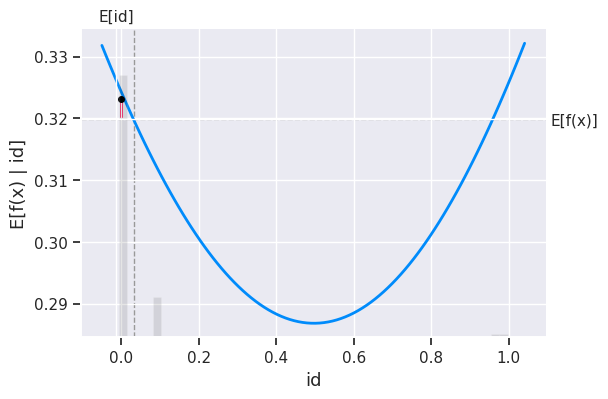

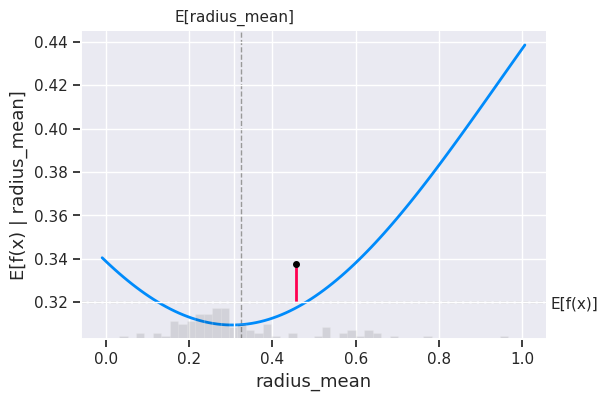

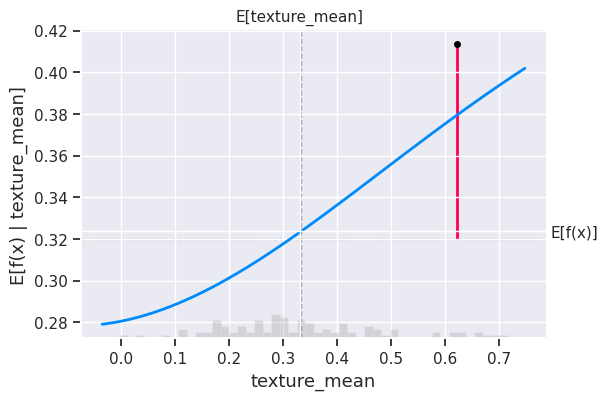

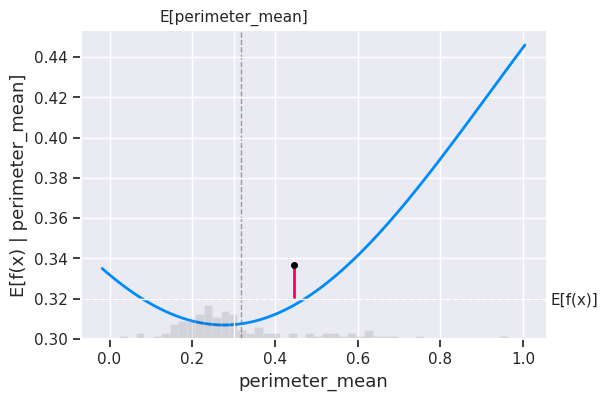

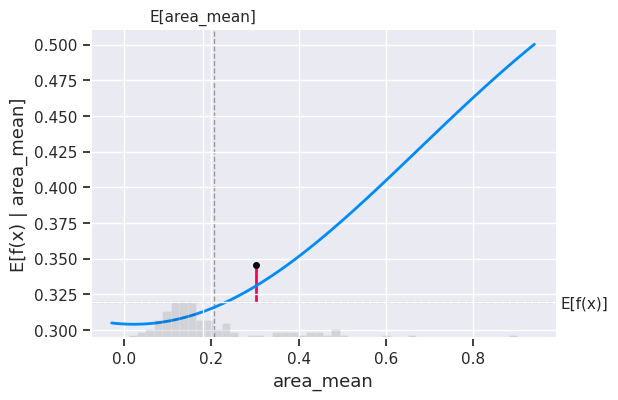

...

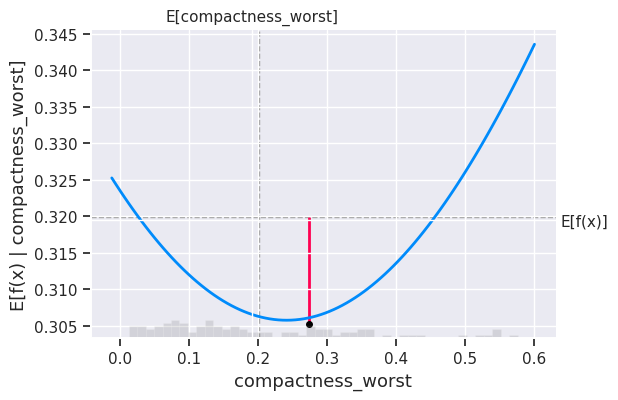

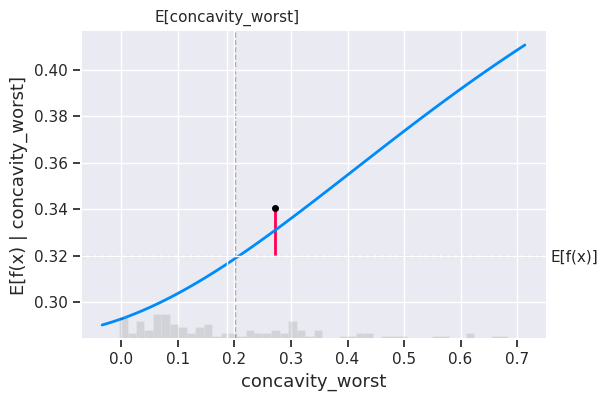

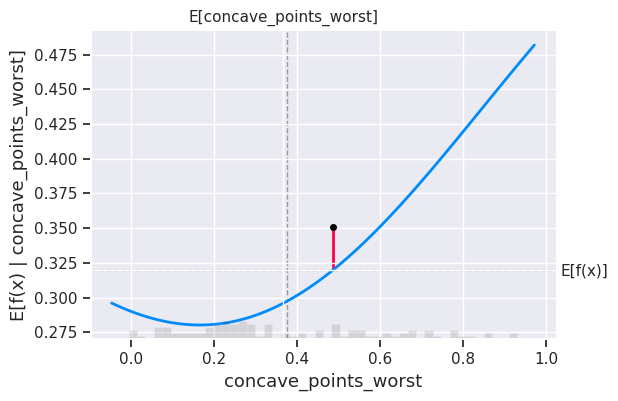

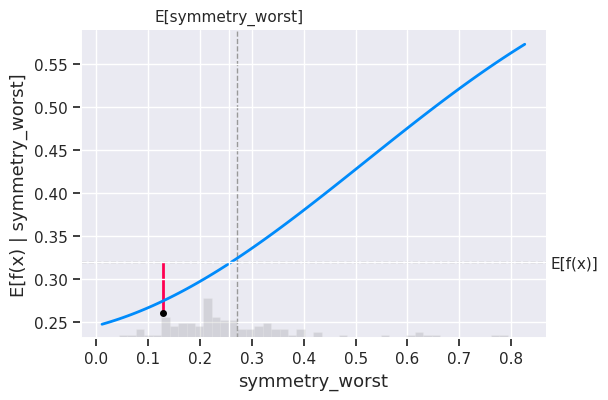

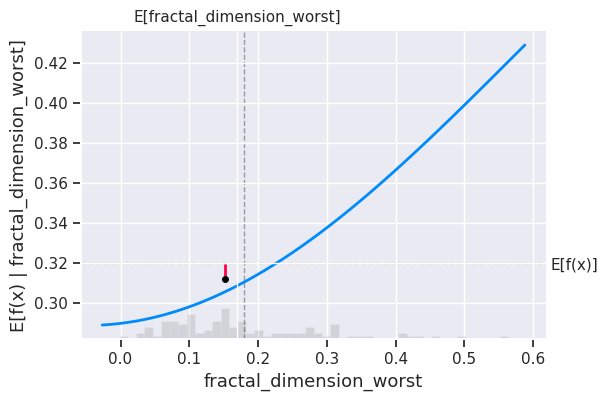

In [88]:
# make a standard partial dependence plot

for i in x_train_100.columns:

    sample_ind = 31
    fig, ax = plt.subplots(figsize=(6, 4))  # set figure size
    shap.partial_dependence_plot(
        i,
        svm_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=svm_shap_values[sample_ind : sample_ind + 1, :],
        ax=ax,  # specify the axis to use for the plot
    )
    plt.show()



# **Interpreting SVM Regressor using SHAP values**


1. This script produces partial dependence plots for each variable in the x_train dataset, utilizing SHAP values derived from the SVM regressor. These plots illustrate how each feature impacts the prediction for an individual sample.

2. Examining the feature compactness_mean, we observe that at the SVM regressor model's estimate, the cross occurs around the expected value of approximately 0.32.
3.  This indicates that as compactness_mean increases, the expected prediction value also tends to rise.

4. The red line in the plot represents the scenario when a particular sample (sample index = 31) is inputted into the model. This visual helps to highlight the deviation of the actual model output from the expected value.

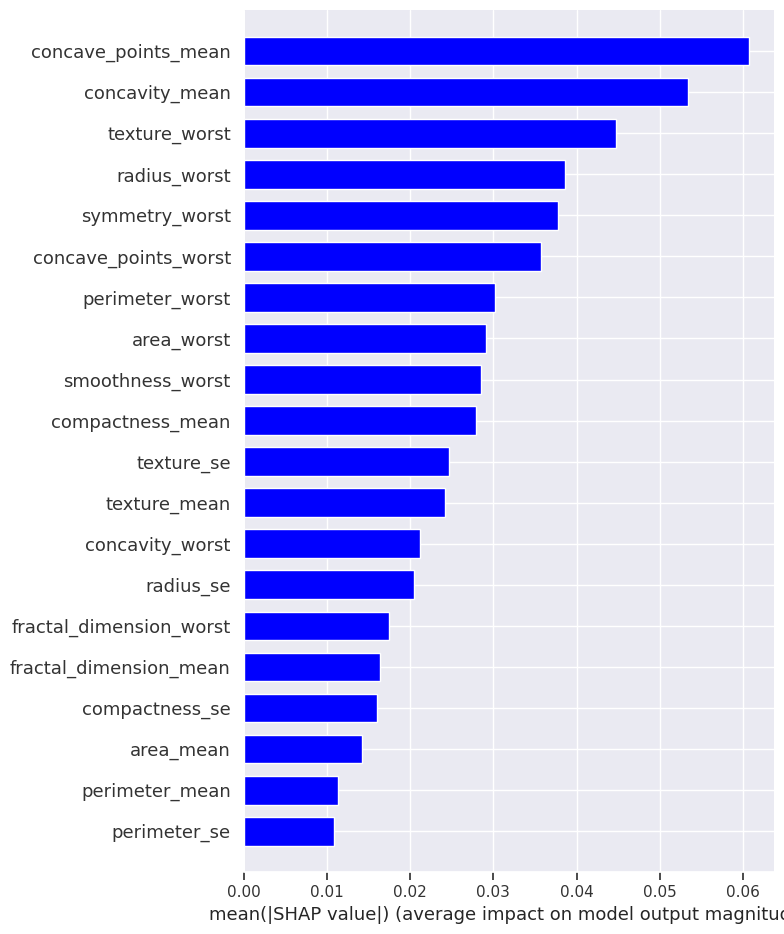

In [89]:
# SHAP variable importance for a Linear Model
shap.summary_plot(svm_shap_values, x_train, plot_type="bar", color="blue")

## **Observations**

The following plot is

SHAP feature importance plot for SVM model
Using the above plot we can come on the conclusion that the **concave_points_mean** is the most important feature, followed by **concavity_mean** and **texture_worst**

# **Interpret the summary plot SVM Model**

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

The SHAP summary plot is a powerful tool for understanding the influence of features in a machine learning model. Here's what the plot reveals when executed with the code shap.summary_plot(shap_values, X_train):

This plot is made of all the dots in the train data. It delivers the following information:

1. __Feature importance:__ Features are organized by their importance in descending order.
2. __Impact:__ The horizontal positioning of the dots indicates whether the effect of the value is associated with higher or lower predictions.
3. __Value Significance:__ The color coding indicates the magnitude of the feature value, with high values in red and low values in blue.
4. __Feature Relationships:__ For example, a high texture_worst feature value, shown in red, has a modestly positive effect on the diagnosis outcome, as indicated on the horizontal axis. Similarly, high values of symmetry_worst are positively associated with the likelihood of disease.


This visualization method is exceptionally insightful for dissecting the operational mechanics of the model and how each feature contributes to the overall predictions.

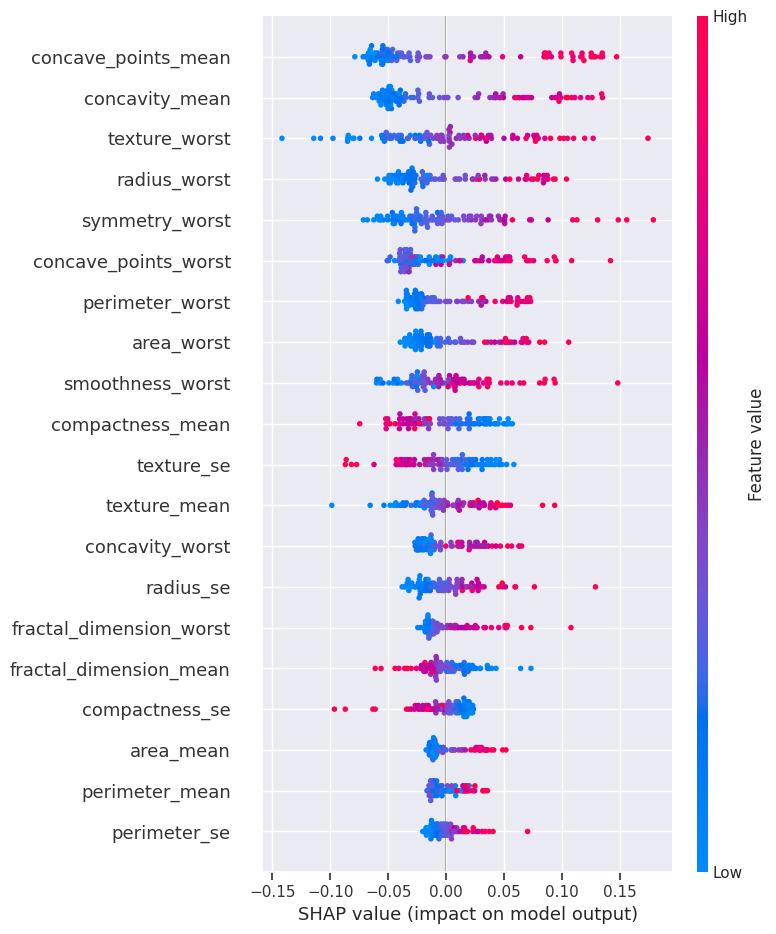

In [90]:
# SHAP summary for Linear Model
shap.summary_plot(svm_shap_values, x_train_100)

# **SHAP Analysis for Linear and Tree-Based Models**

- __SHAP (SHapley Additive exPlanations)__ is an approach to interpret the predictions of machine learning models. It highlights how each feature contributes to the model's prediction for a specific instance, offering a consistent framework to gauge feature importance across various models.

- For __linear models__, SHAP values are derived from the model's coefficients. Specifically, the SHAP value for a feature is computed as the product of the feature's coefficient and the change in the prediction that occurs when the feature is included versus when it is excluded.

- For __tree-based models__, SHAP values utilize the structure of the decision trees and the specific feature values of the instance being analyzed. A feature's SHAP value in this context is the difference in the model's average prediction with the inclusion of the feature versus its exclusion, calculated across all possible combinations of features.

PermutationExplainer explainer: 513it [00:32, 11.44it/s]                         


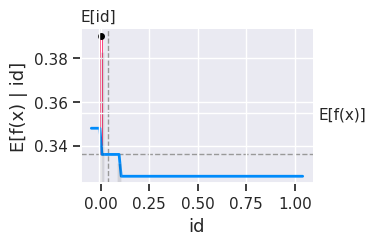

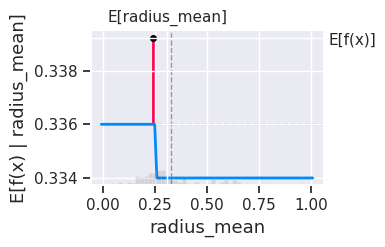

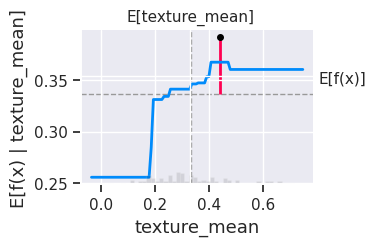

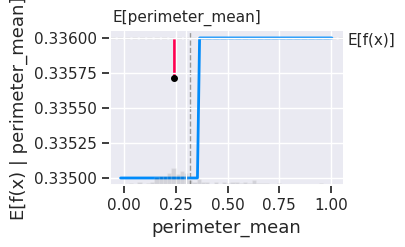

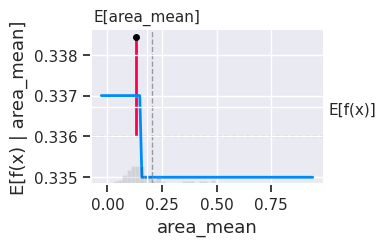

...

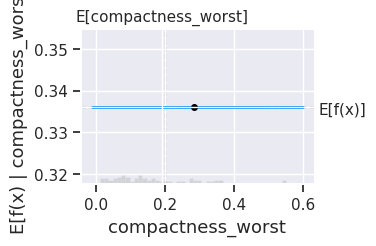

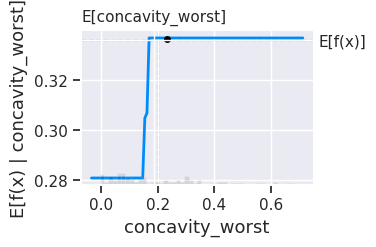

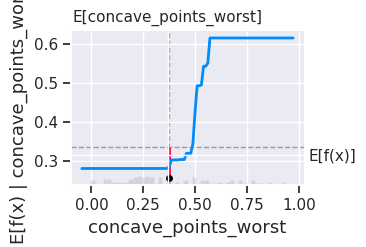

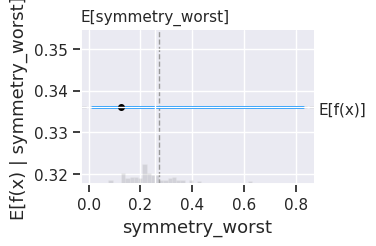

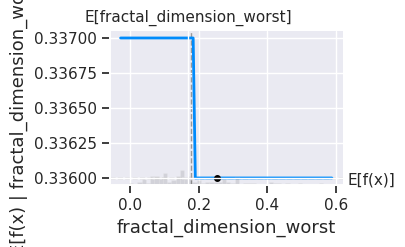

In [91]:
#This code is performing a SHAP partial dependence plot for a Tree Model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 31
    fig, ax = plt.subplots(figsize=(3,2)) # Create a new figure with the desired size
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
        ax=ax
    )

## **Analysis**
1. This script creates partial dependence plots for each attribute in the x_train dataset by leveraging SHAP values generated from the tree-based model. These plots illustrate how each feature influences the model’s prediction for an individual instance.

2. Consider the compactness_mean feature as an example. In the tree-based model, the intersection occurs around the estimated value E[f(x)] 0.336 (approximately).

3. This indicates that an increase in compactness_mean corresponds to an increase in the expected prediction value.

4. The red line on the plot represents the scenario where a specific sample (sample index = 31) is used to probe the model. This visualization helps illustrate how the actual model output deviates from the expected value.


Note: It is assumed that tree_model is a type of tree-based model, such as a Decision Tree, Random Forest, or Gradient Boosting Machine, which inherently differs in structure from linear models. The tree_explainer is specifically tailored to address these differences and accurately compute SHAP values for tree-based models.

PermutationExplainer explainer: 513it [00:27, 14.32it/s]                         


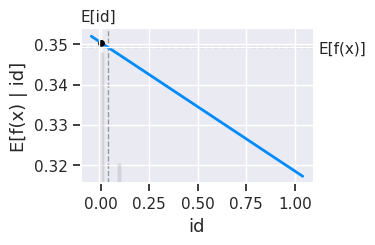

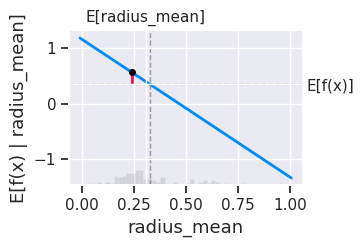

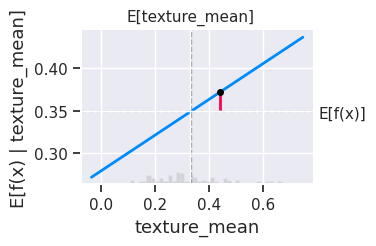

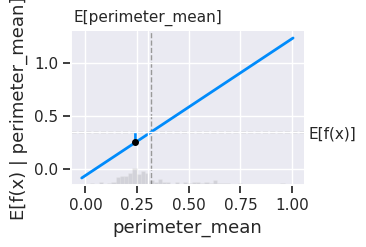

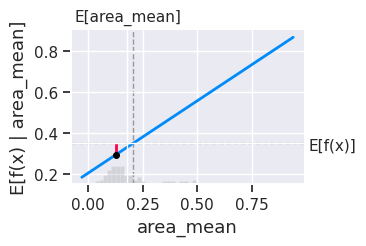

...

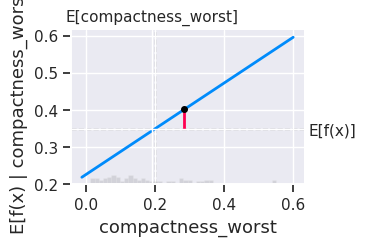

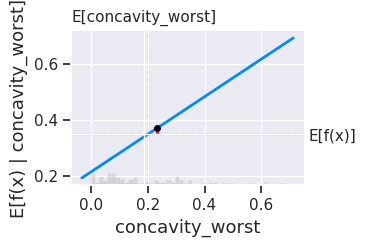

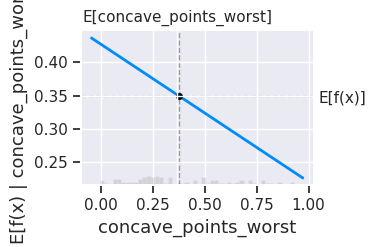

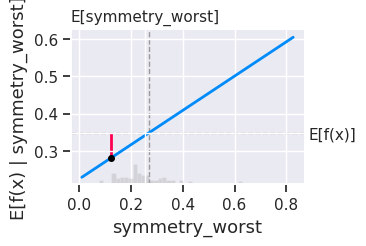

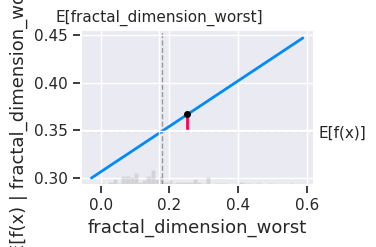

In [92]:
import matplotlib.pyplot as plt
#This code is performing a SHAP partial dependence plot for a linear model

linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)

for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 31
    fig, ax = plt.subplots(figsize=(3,2)) # Create a new figure with the desired size
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
        ax=ax # Pass the axes of the new figure to the function
    )

# **Analysis:**
1. The provided code produces partial dependence plots for each variable within the x_train dataset, utilizing SHAP values derived from the linear model. These plots depict how individual features influence the model's prediction for a specific sample, which in this case is sample number 31.

2. The focus here is solely on creating partial dependence plots to observe the incremental impact of each feature on the model’s predictions, rendering Individual Conditional Expectation (ICE) plots unnecessary due to their higher computational demands.

3. On these plots, the x-axis represents the feature being analyzed while the y-axis reflects the model's output as that feature varies. A grey histogram displays the distribution of feature values in the dataset, and the intersection of E[Feature] and E[f(x)] marks the expected values.

4. Consider the feature symmetry_mean:
     -- In the linear model, the intersection occurs approximately at E[f(x)] 0.349.
     
5. This implies that an increase in symmetry_mean leads to a rise in the expected prediction value.

6. The red line in the plot highlights the result when a specific sample (sample index = 31) is input into the model. This visual aids in identifying how the actual output of the model differs from the expected value based on varying feature inputs.

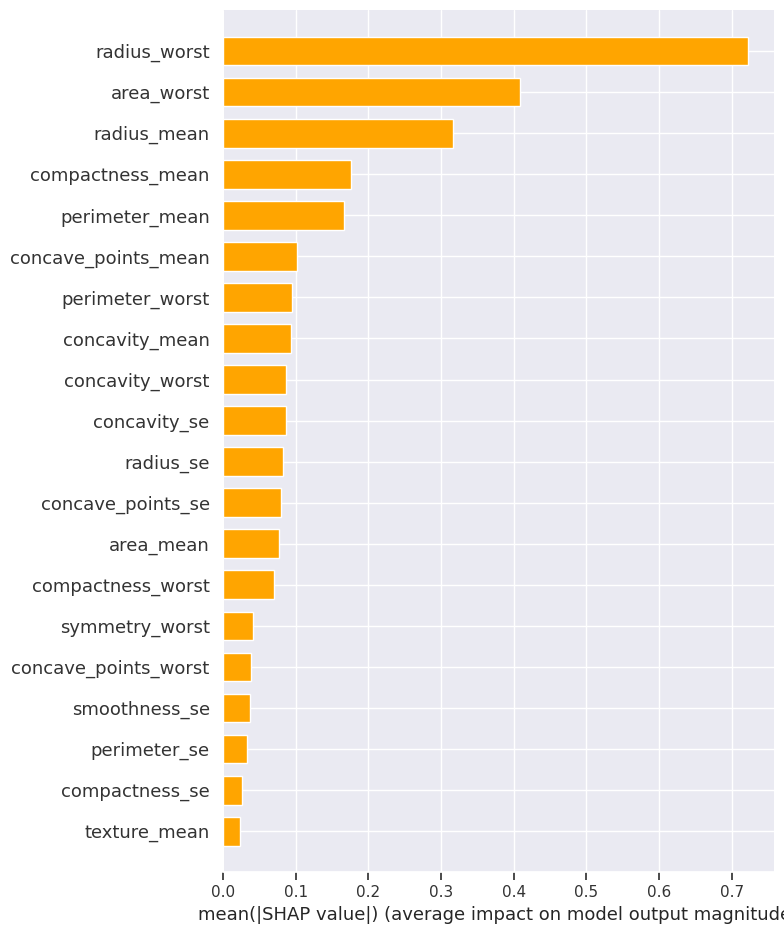

In [93]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="orange")

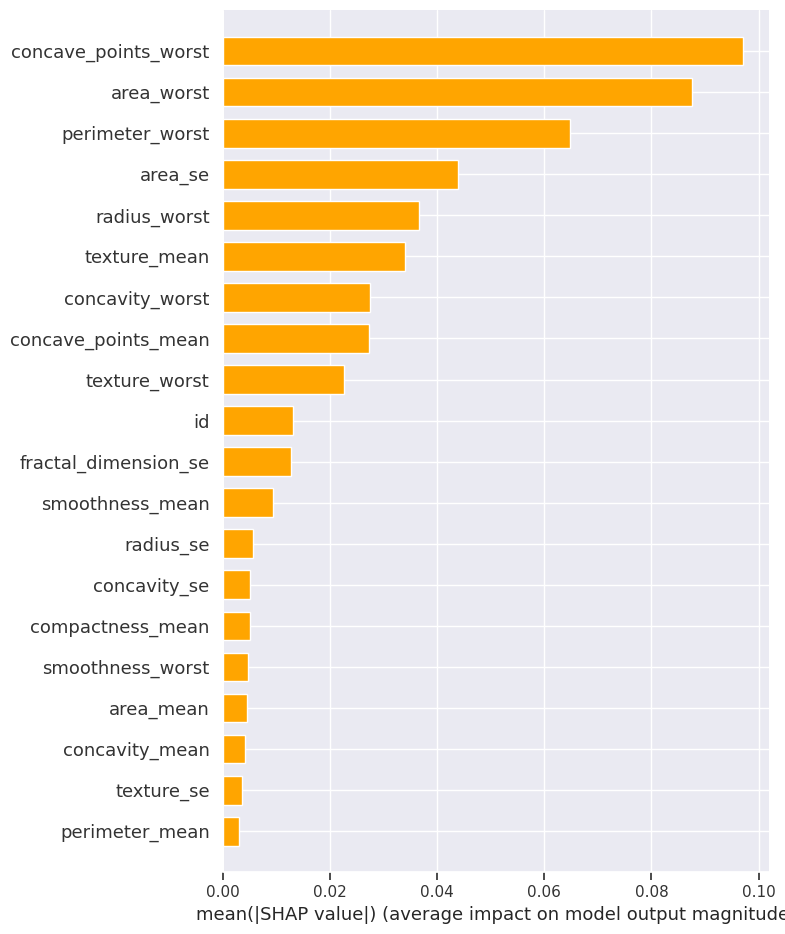

In [94]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="orange")

## **Observations:**
- A variable importance plot ranks the most critical variables from highest to lowest significance.

- Variables at the top of the list have a greater impact on the model's performance, indicating stronger predictive capabilities.

- Using the shap.summary_plot function with the plot_type="bar" option allows for the generation of this variable importance plot.

## **Interpret the summary plot for the Linear and Tree-based model**


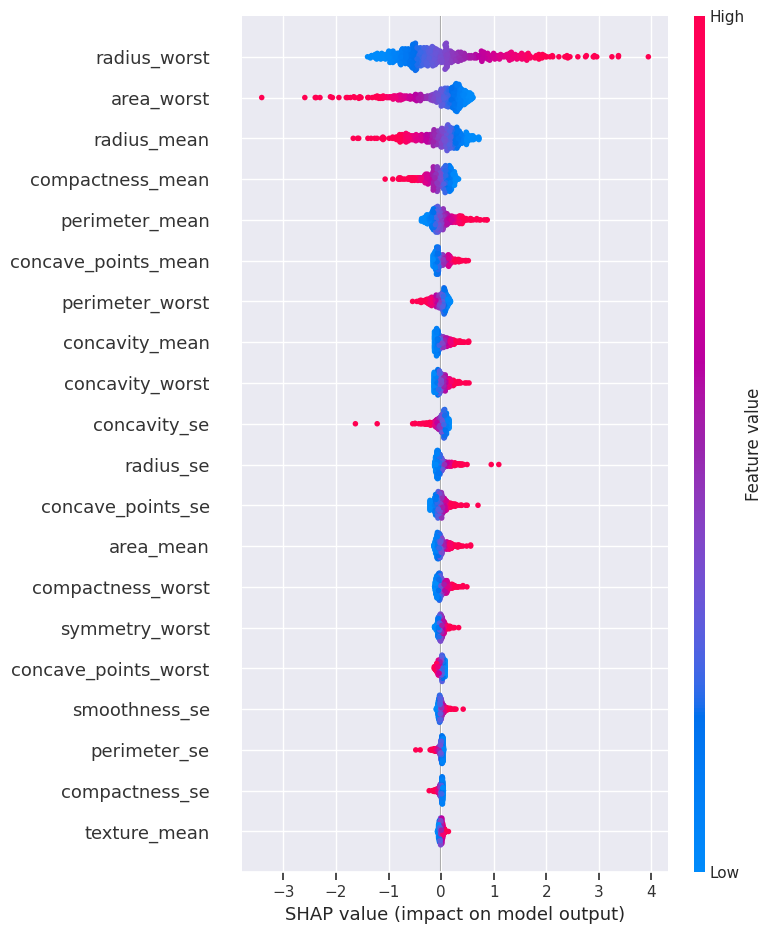

In [95]:

# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

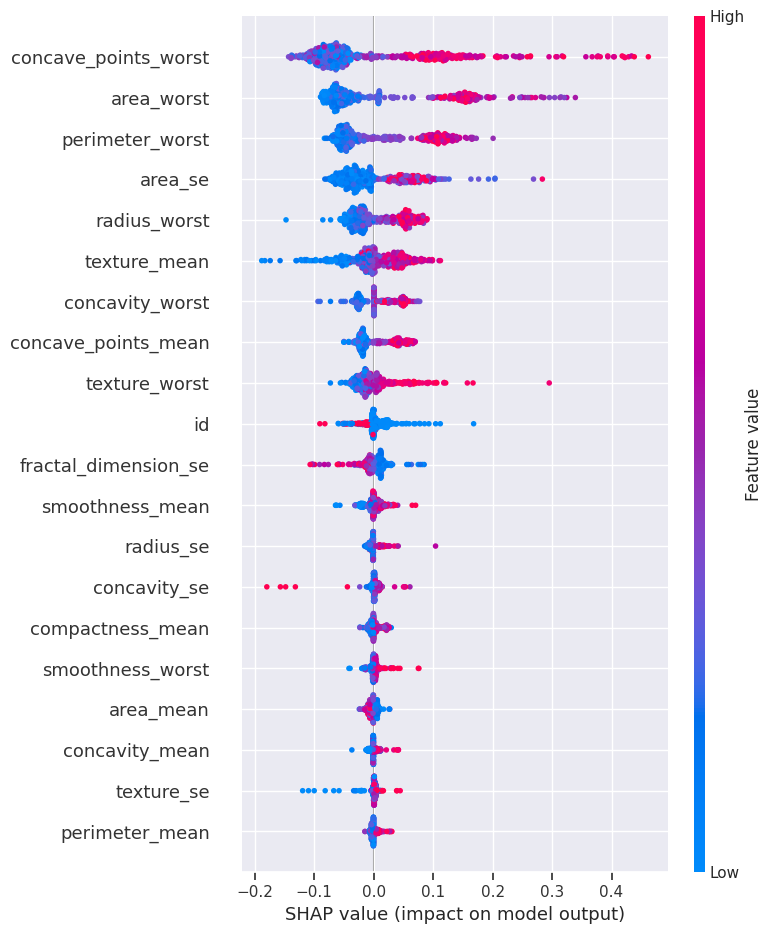

In [96]:
# SHAP summary for Tree Model
shap.summary_plot(tree_shap_values, x_train)

# Observations:
The SHAP value plot illustrates how predictors positively or negatively influence the target variable. The function shap.summary_plot(shap_values, X_train) generates a plot that offers insights into the interactions within the training data:



1. __Feature importance:__ This ranks variables in order of their influence on the model, from most to least important.
2. __Impact:__ The position of a value on the horizontal axis indicates whether its effect increases or decreases the prediction outcome.
3. __Original value:__ The color coding displays high values in red and low values in blue, indicating their magnitude for a particular observation.
4. __Specific Influences__:For example, a high "radius_worst" is shown to have a subtle yet positive effect on the diagnosis outcome, suggesting lower susceptibility to breast cancer. The term “high” is depicted in red, and the positive effect is marked along the X-axis.
5. __Another Example__:concave_points_worst" is positively associated with the target variable, implying that higher levels may increase the likelihood of the disease.


Note: Attributes that end with 'worst' in their names (like radius_worst, texture_worst, etc.) denote the worst or most extreme mean values found within the data, typically calculated from the largest three values of each feature.


## **Interpreting SHAP dependence plot for Linear and Tree-based model**


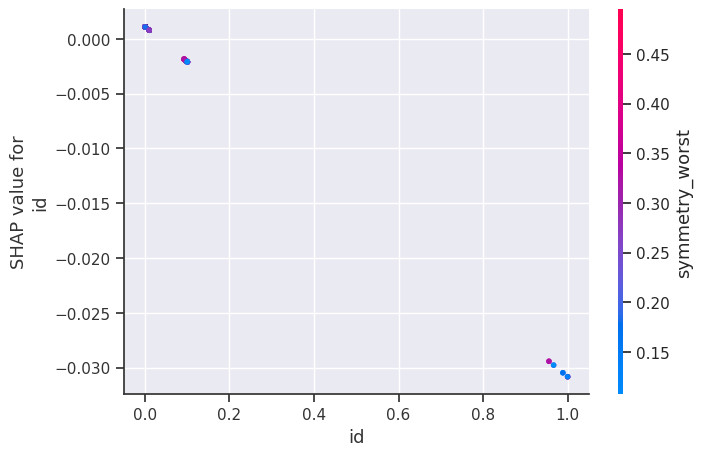

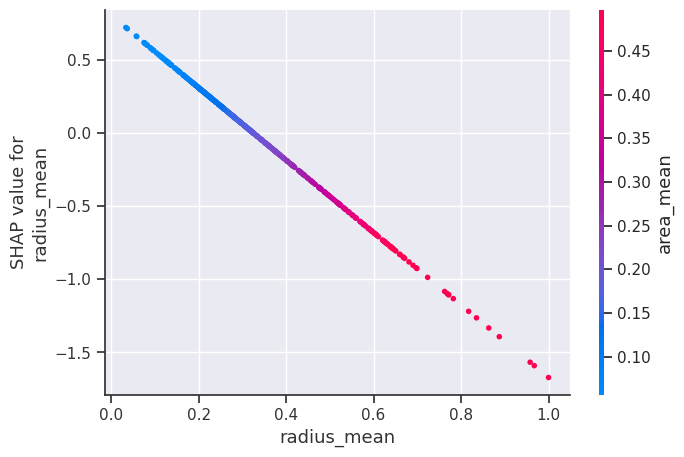

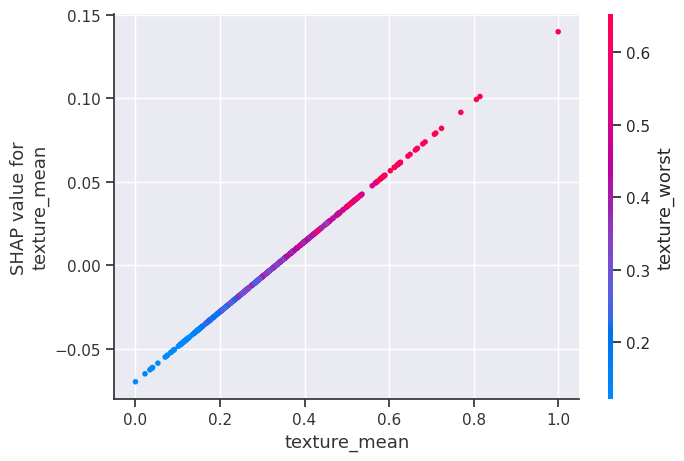

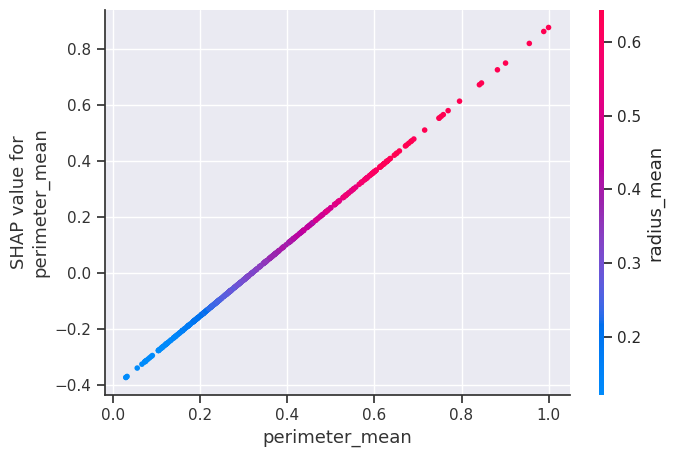

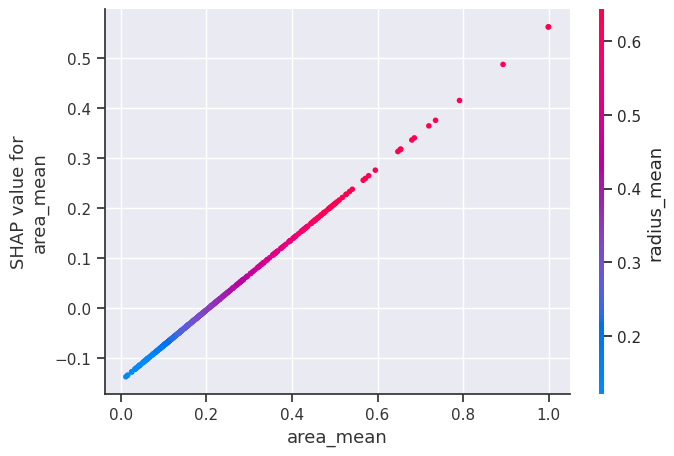

...

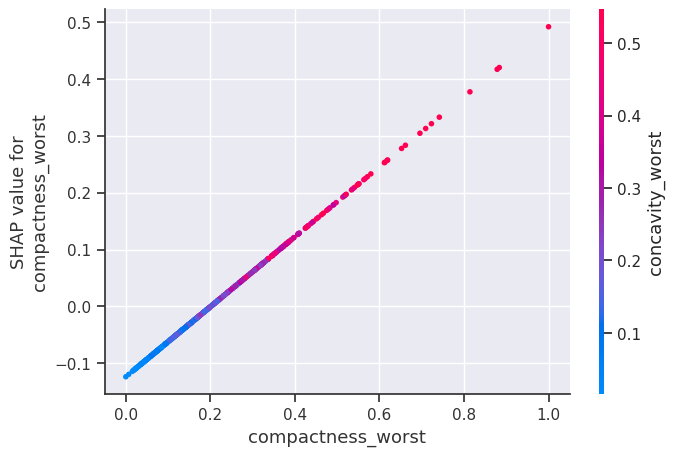

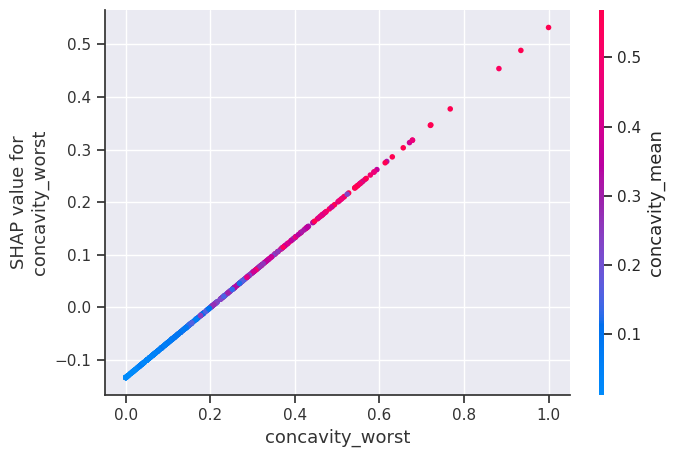

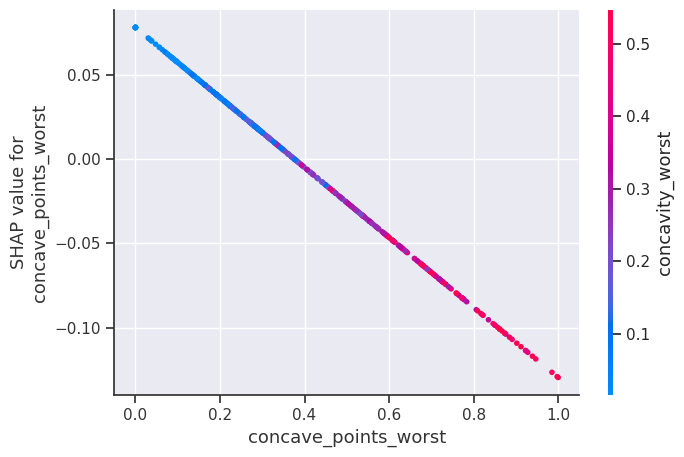

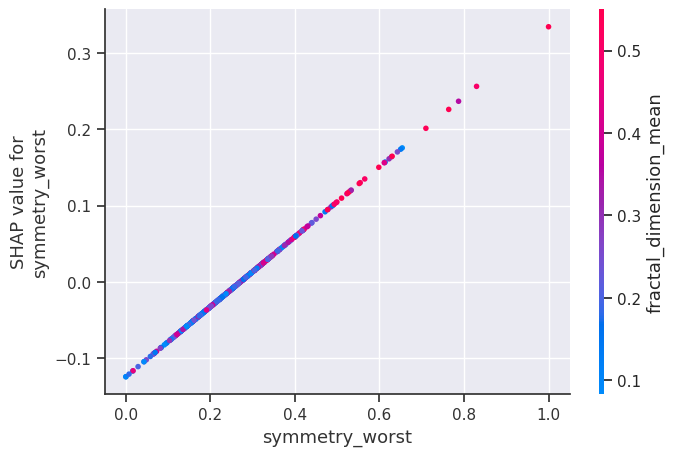

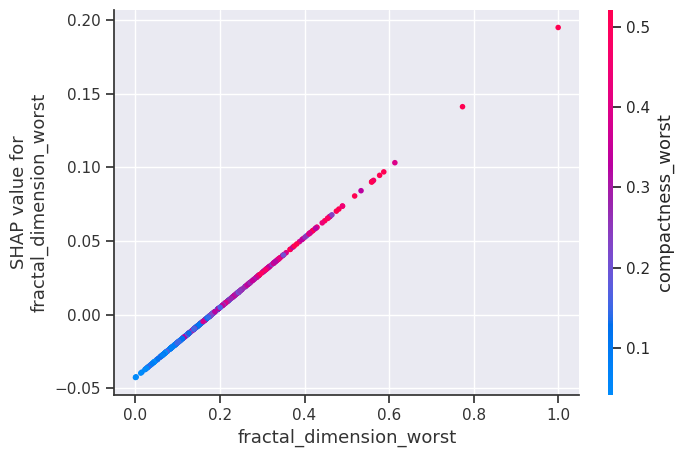

In [97]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

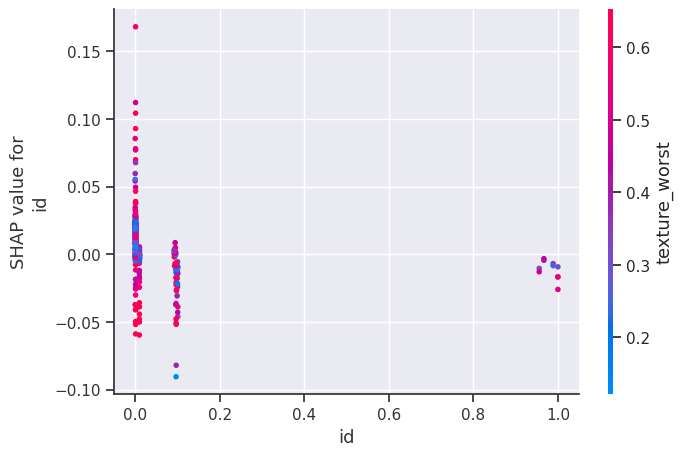

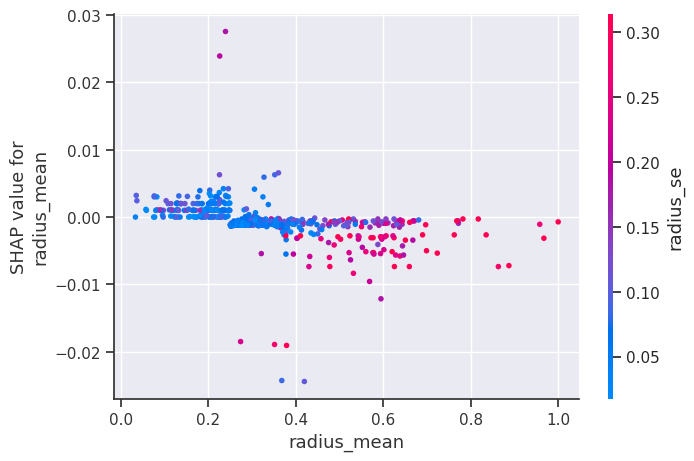

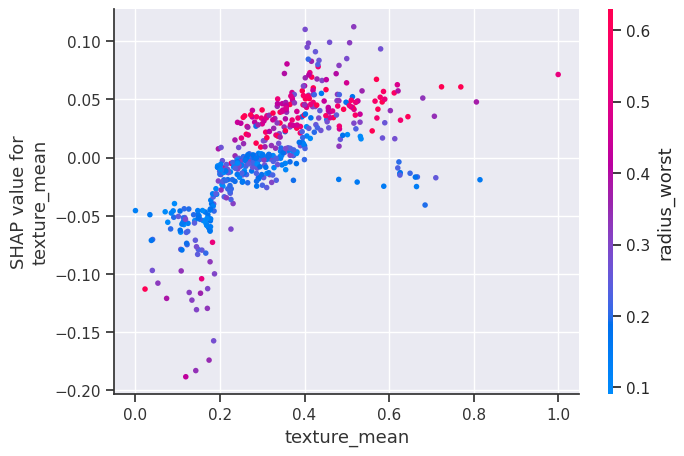

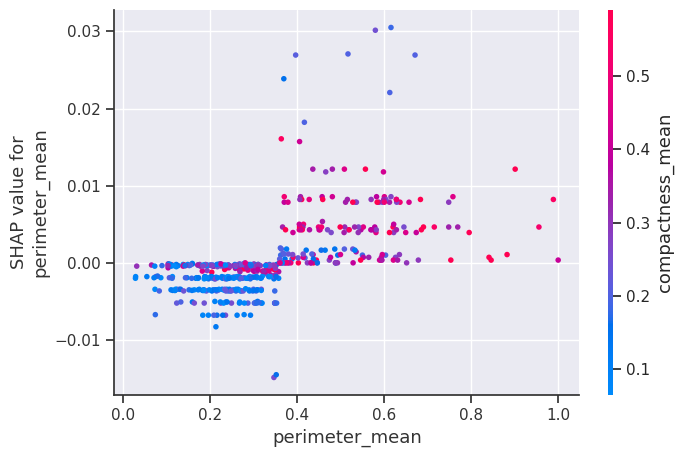

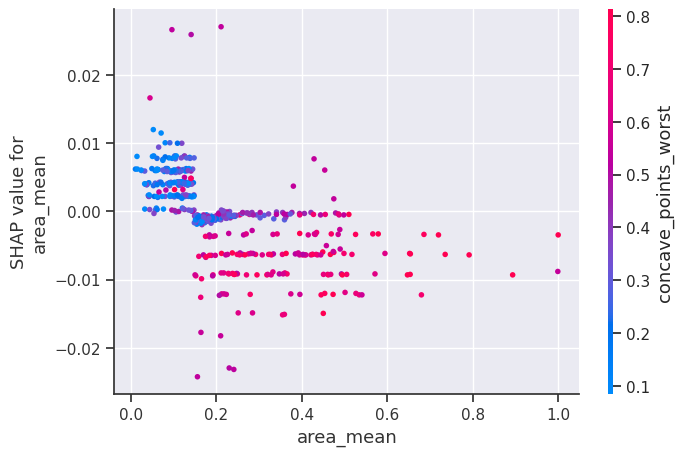

...

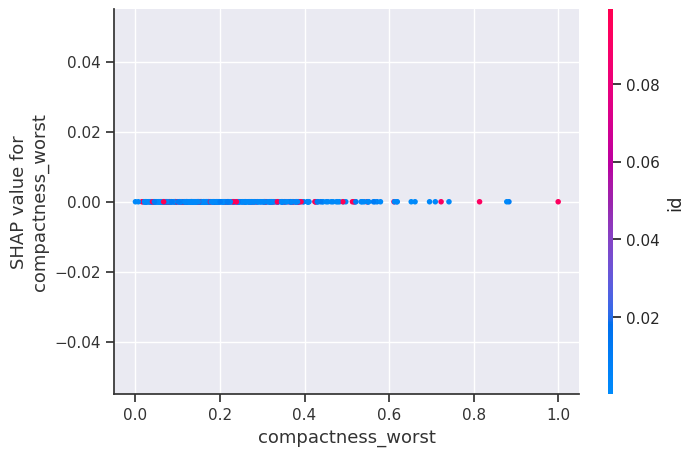

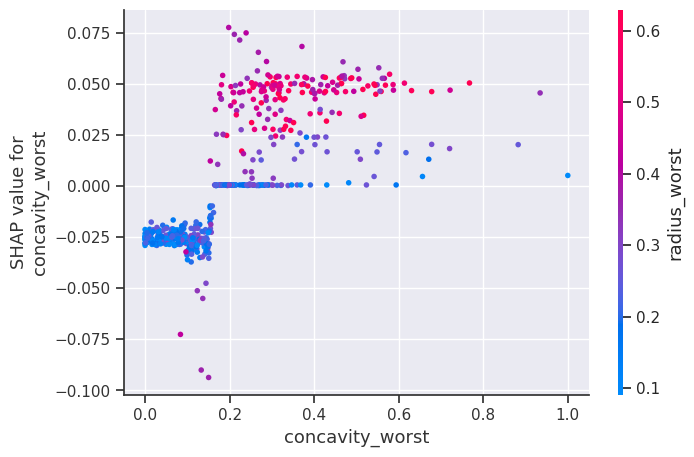

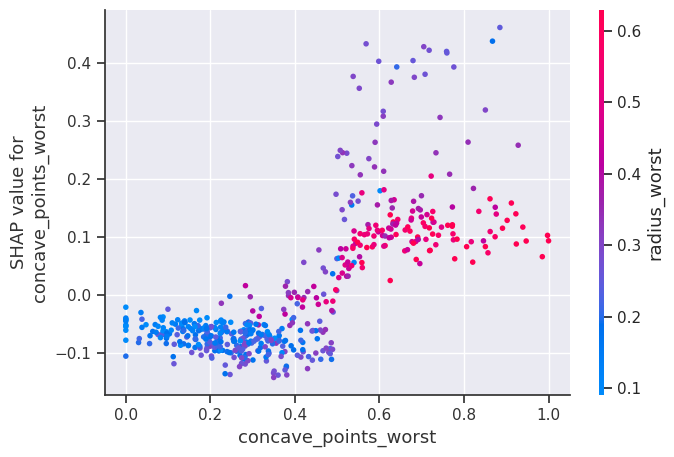

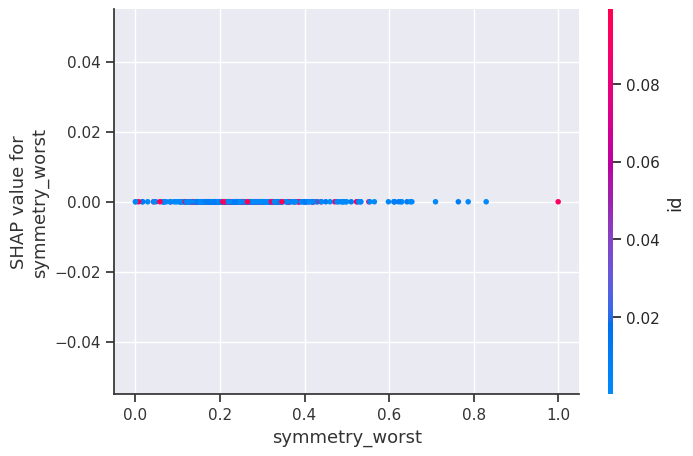

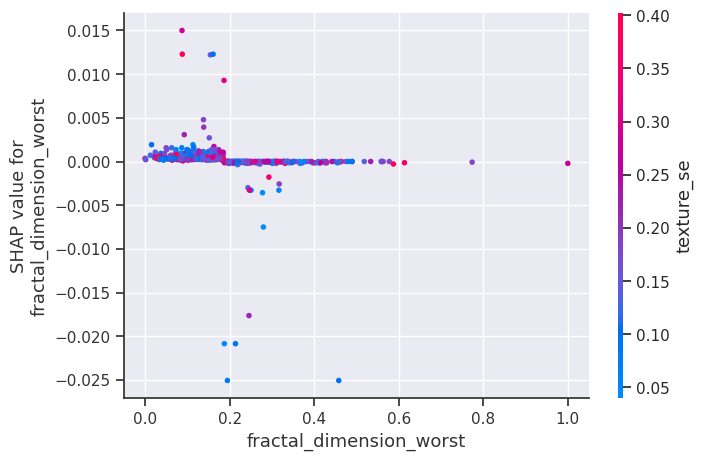

In [98]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

## **Observations**

- Generating a dependence plot can be accomplished with a simple command: shap.dependence_plot("Feature", shap_values, X_train). For this analysis, I cycled through all 31 features, producing individual plots for each.
- The function also automatically incorporates another variable that shows the highest interaction with the selected feature.
- The relationship between "radius_mean" and the target variable appears to be linear, and "radius_mean" often interacts with "radius_se".
- For instance, to specifically examine "radius_mean" and its most interactive variable, you can use the command shap.dependence_plot("**radius_mean**", shap_values, X_train). This will generate a plot similar to the second one I produced for the linear model.


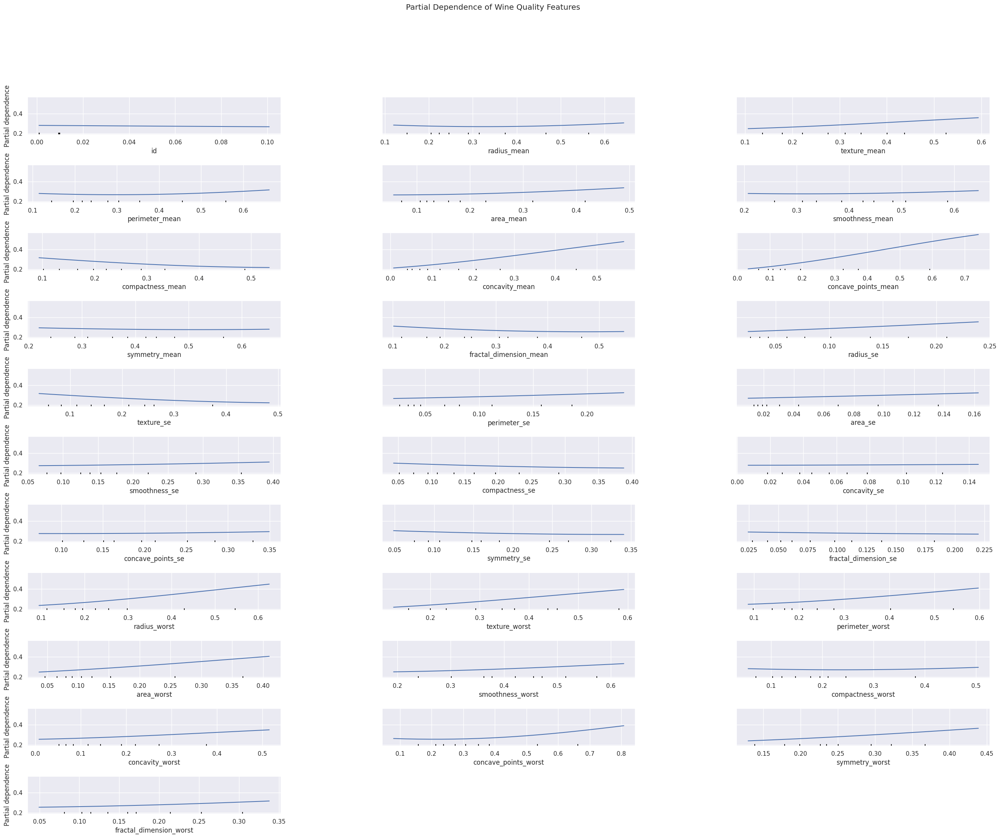

In [99]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# Replace 'svm_model' with your actual model
# Assuming 'x_test' is your test dataset and contains the features you want to analyze

# Generating the Partial Dependence Plot
PartialDependenceDisplay.from_estimator(
    svm_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20
)

# Adjust figure settings
fig = plt.gcf()
fig.set_size_inches(32, 24)  # Set the size of the figure
fig.suptitle("Partial Dependence of Wine Quality Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)

# Display the plot
plt.show()



## **Interpreting AutoML's best model with tuned hyperparameters**


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

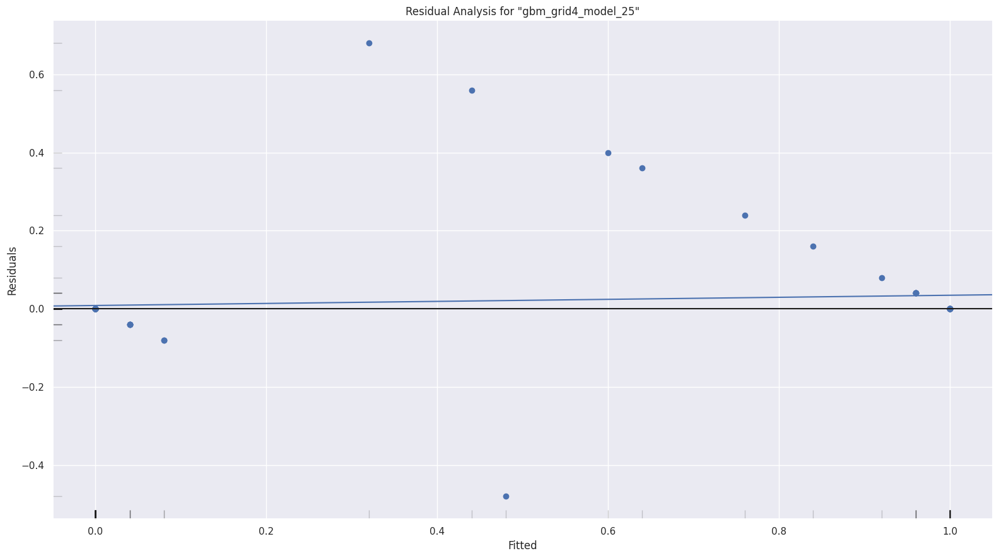

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

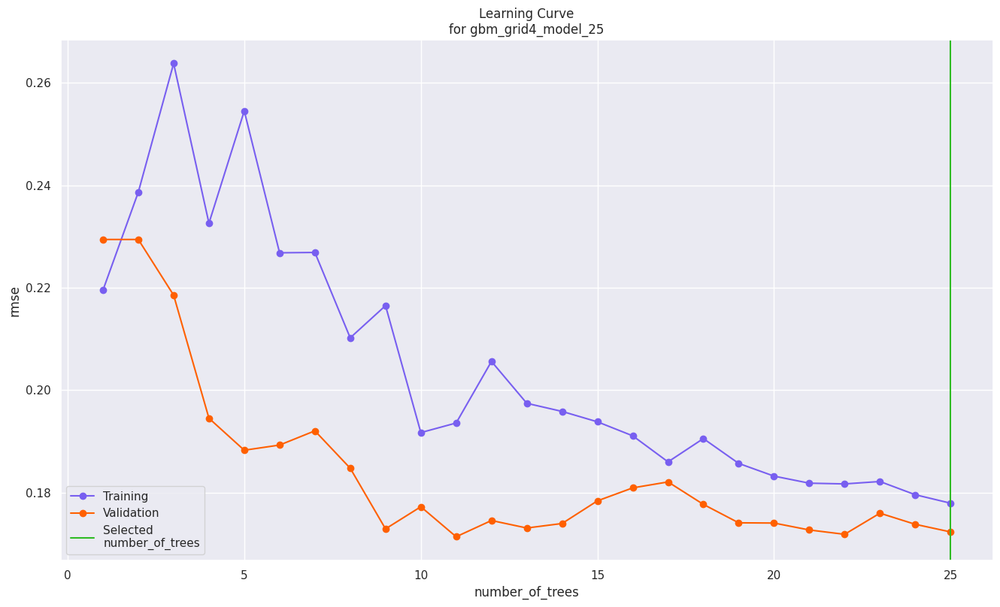

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

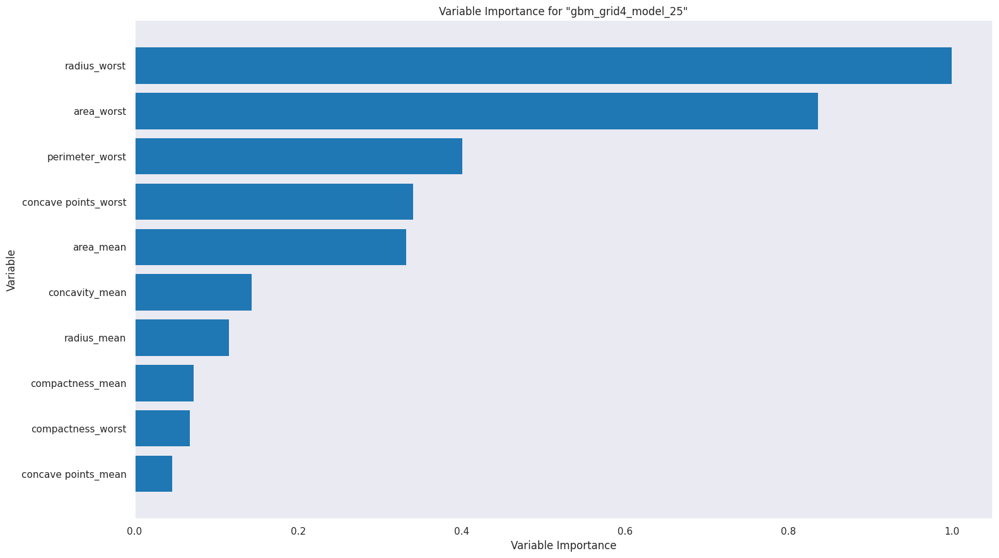

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

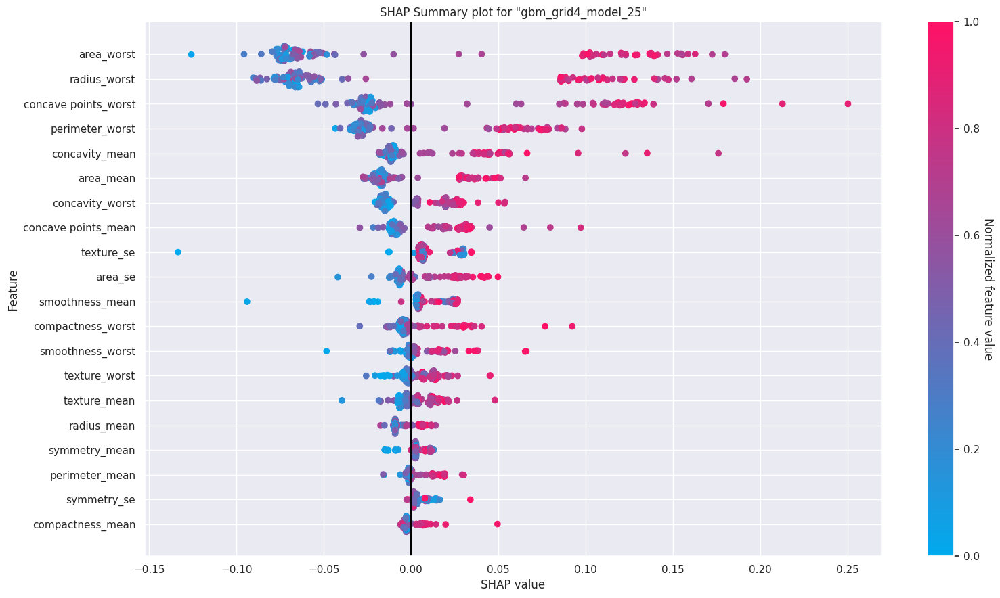

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

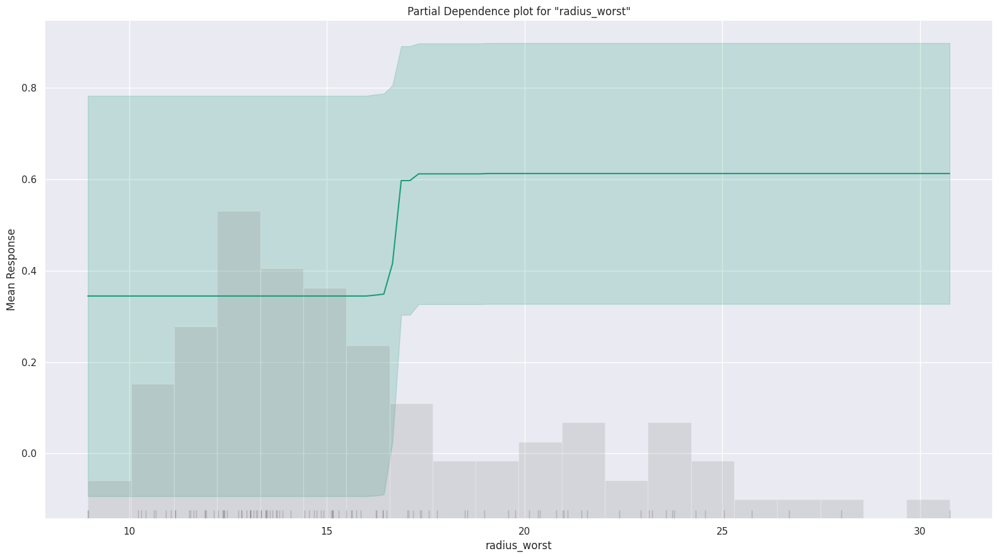

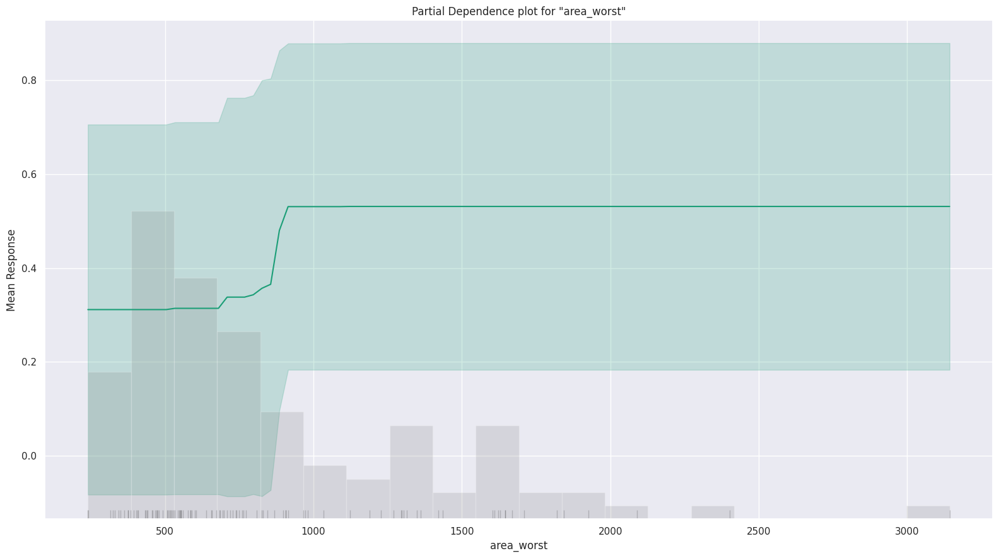

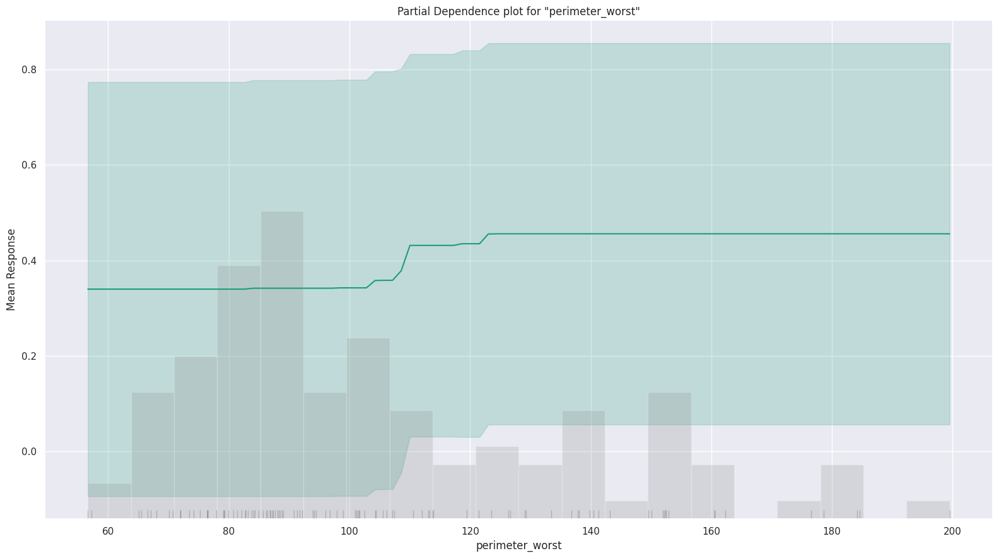

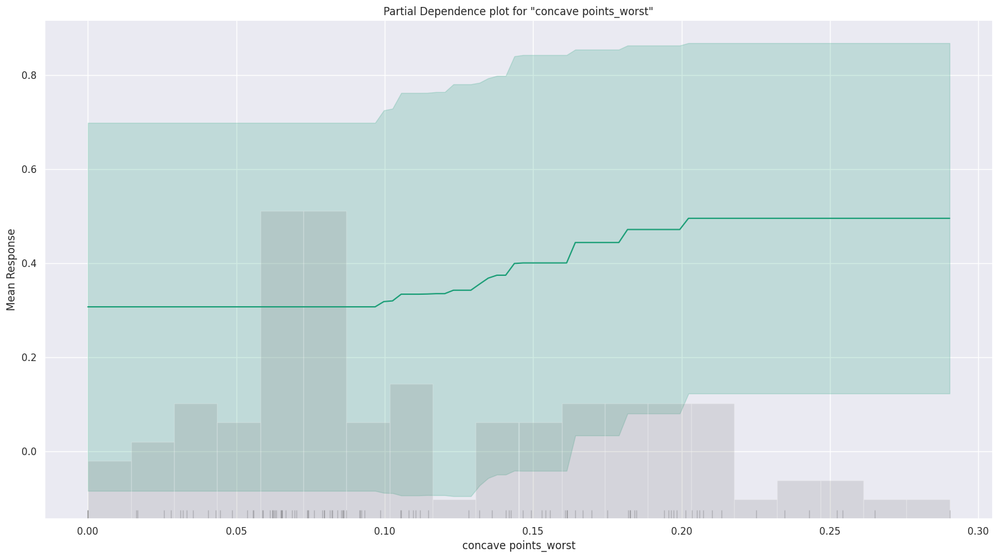

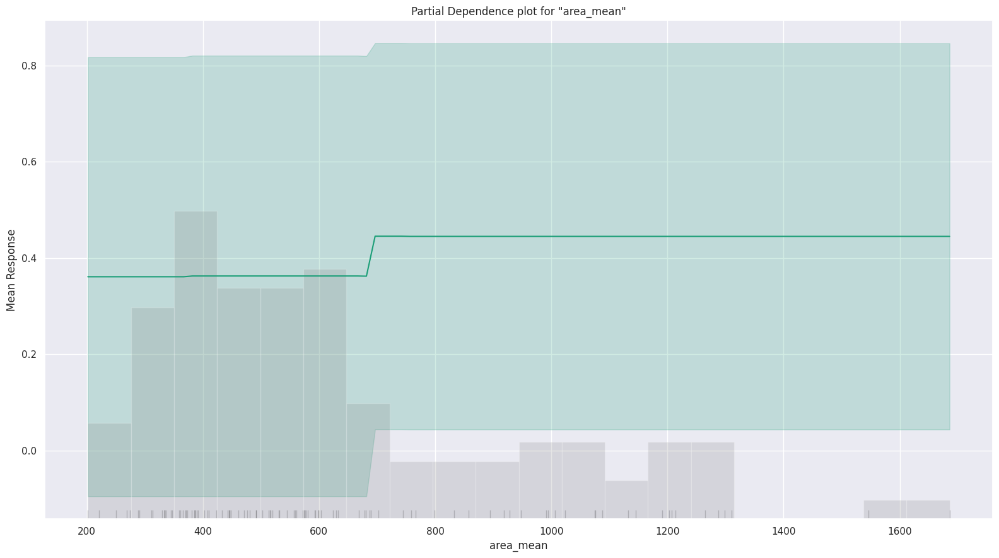

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

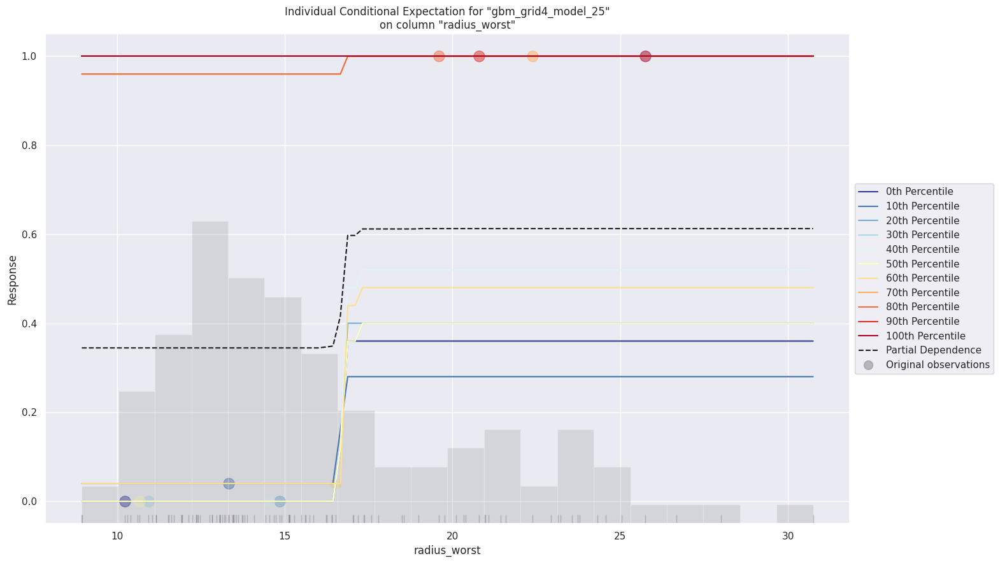

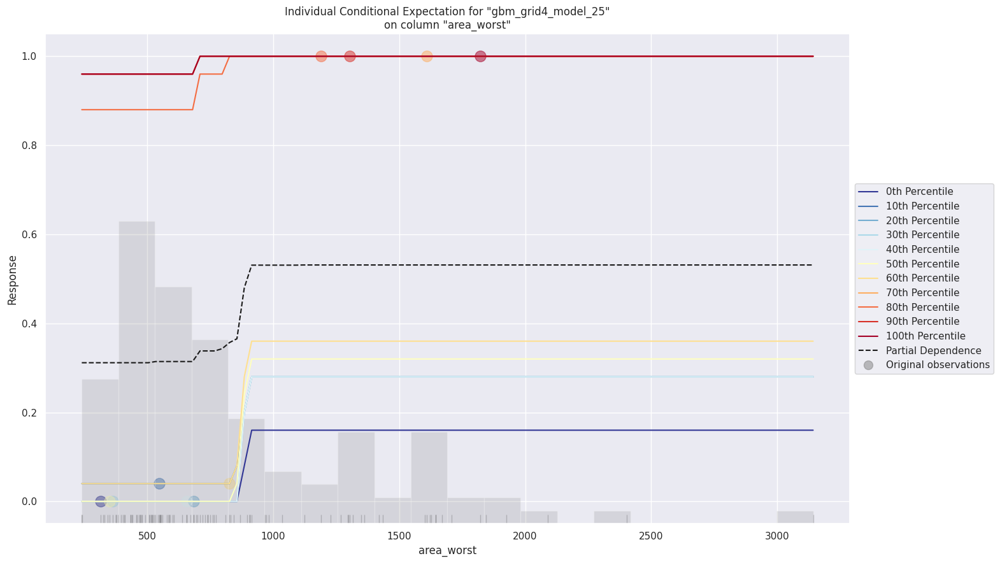

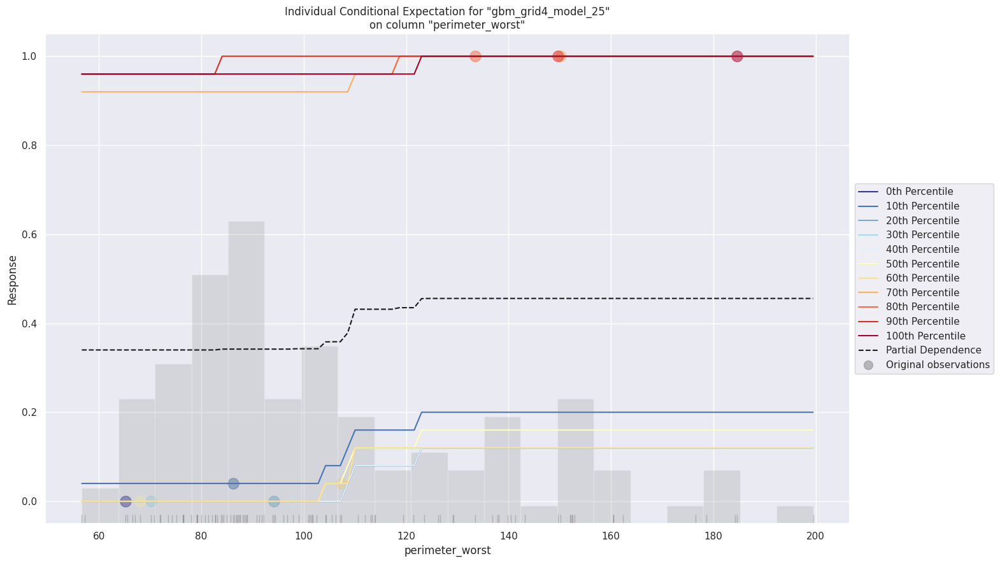

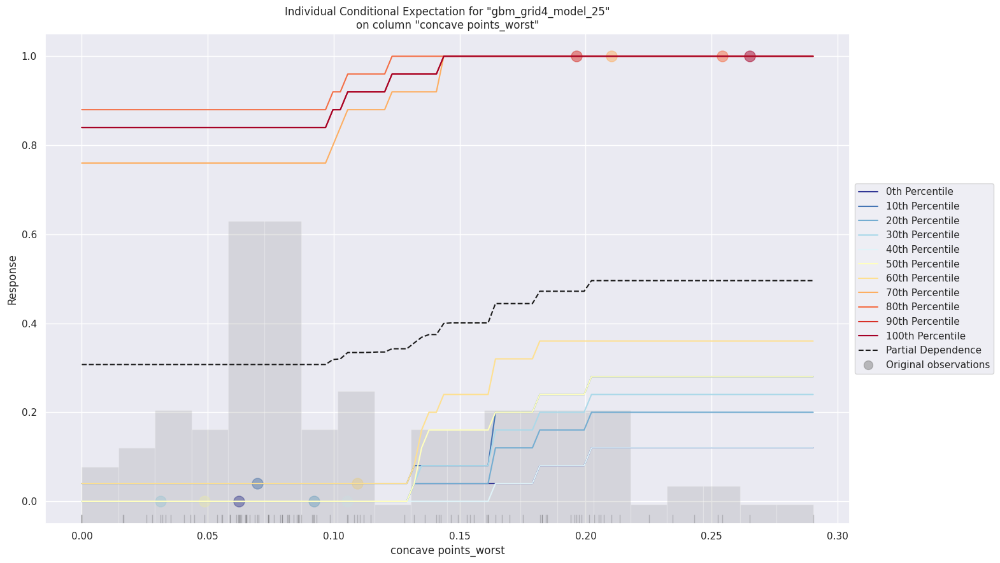

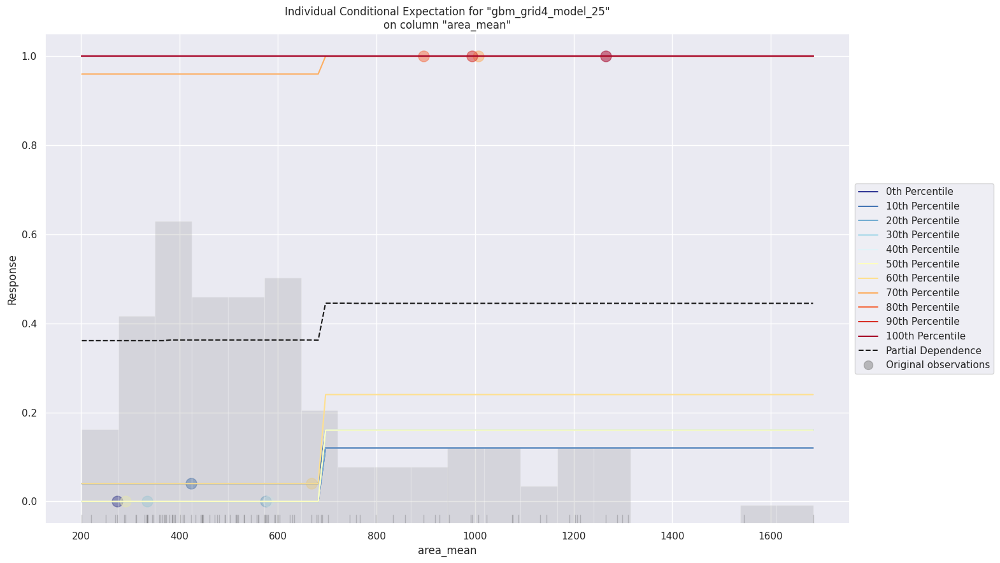

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

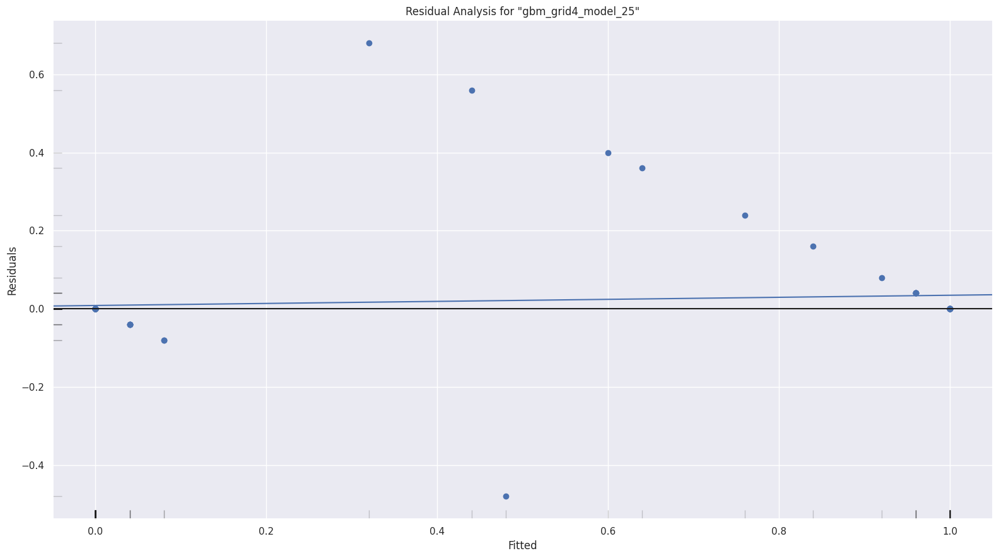

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

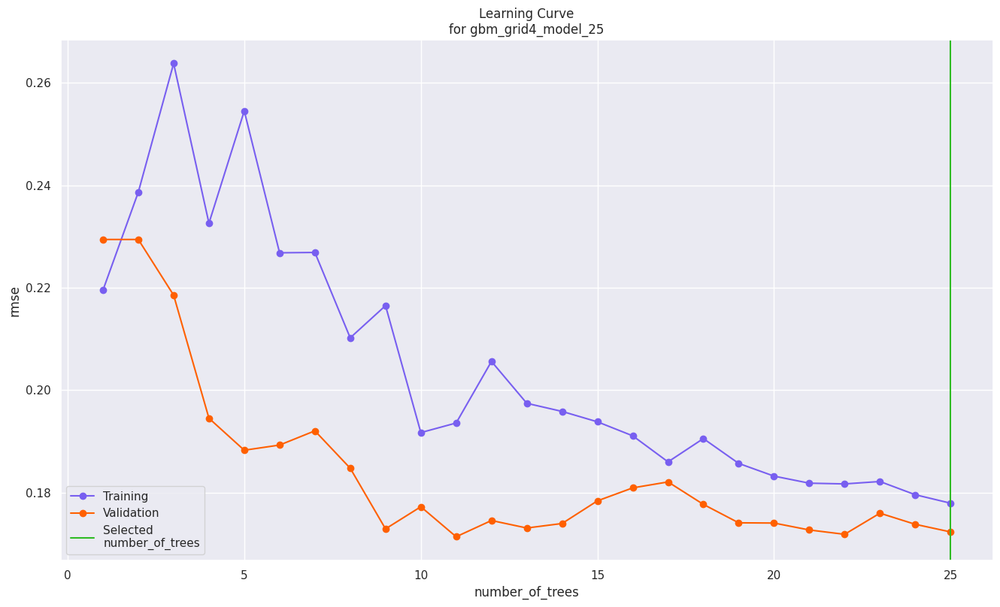

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

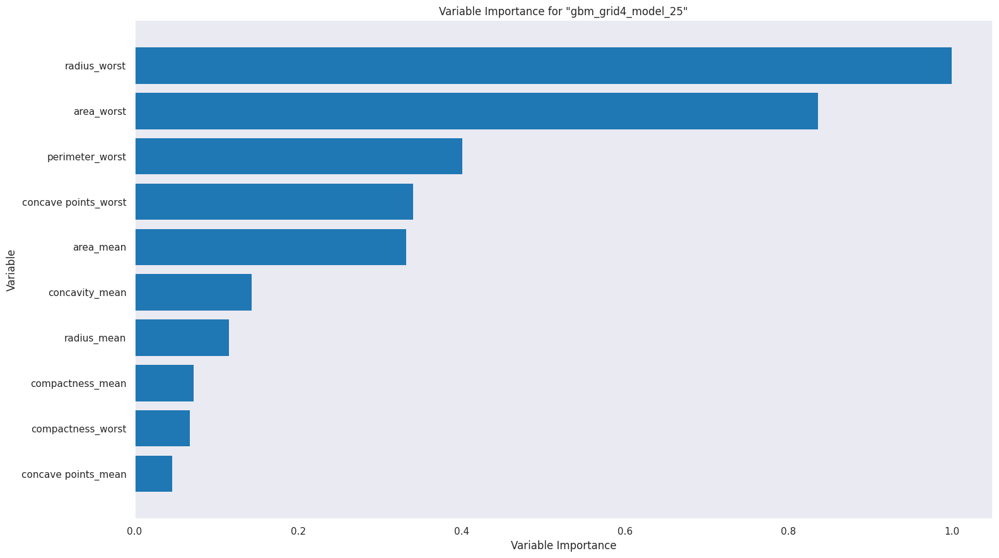

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

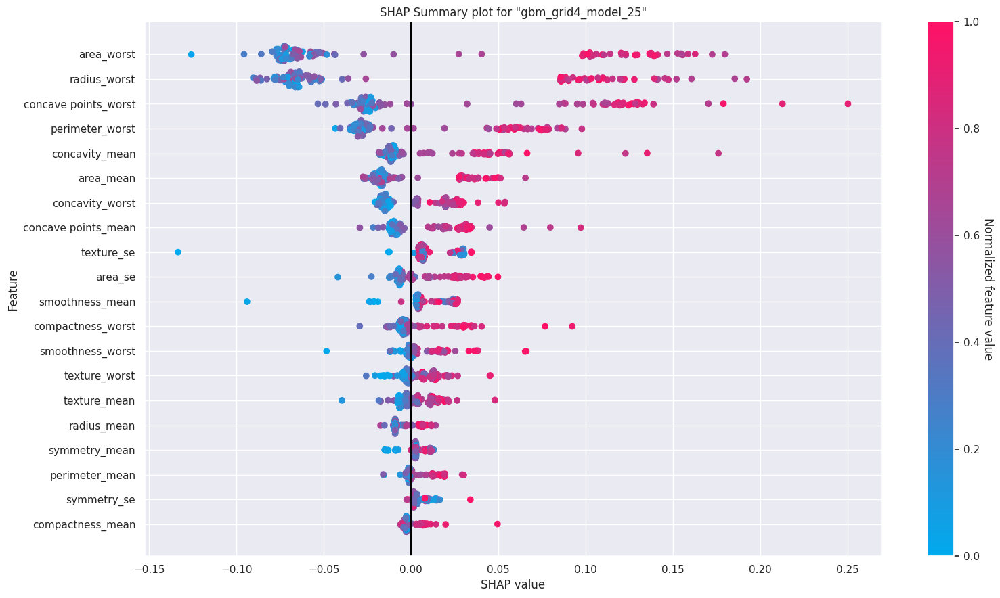

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

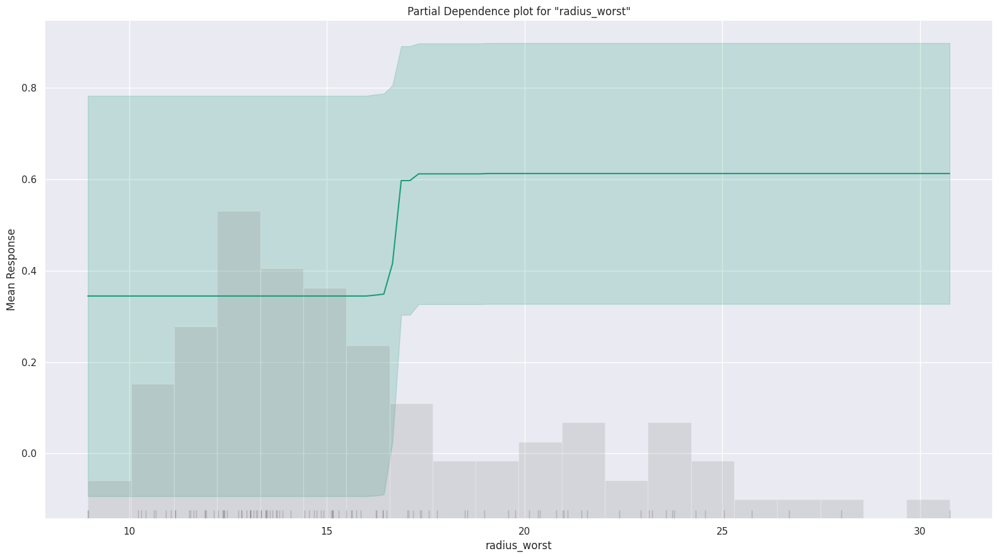

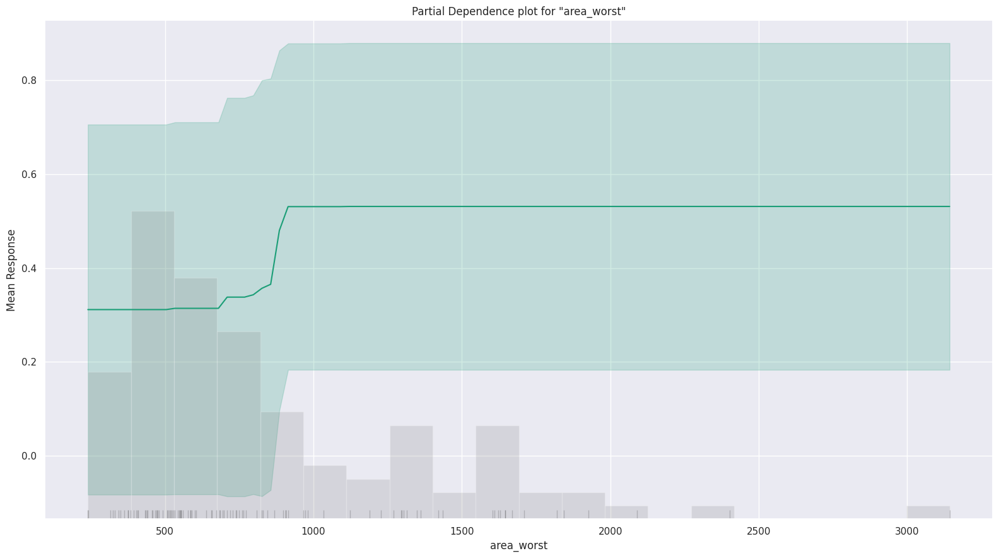

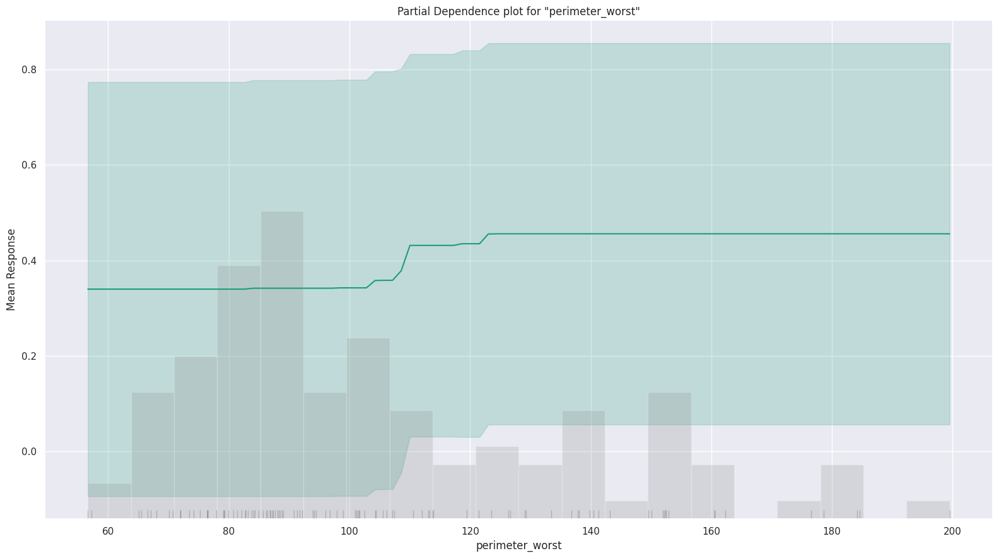

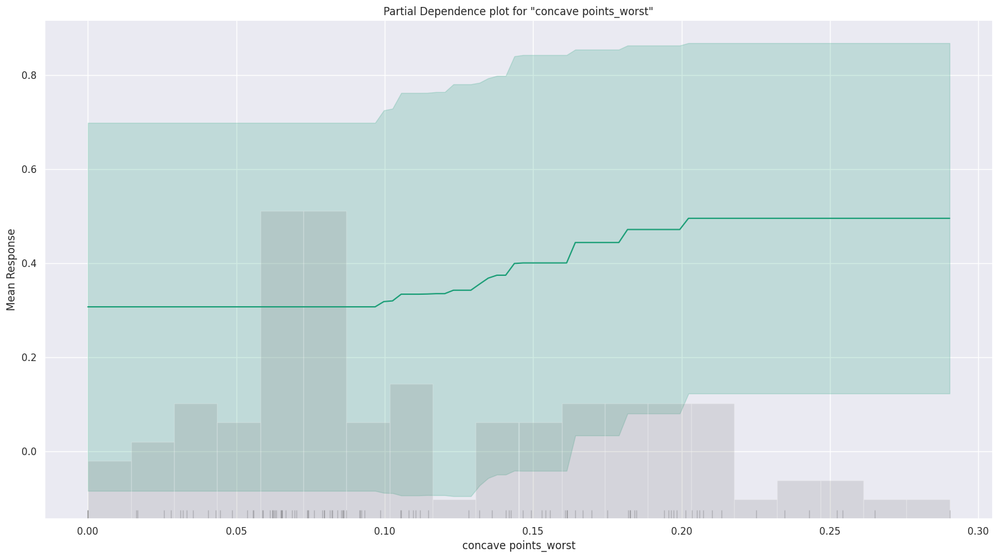

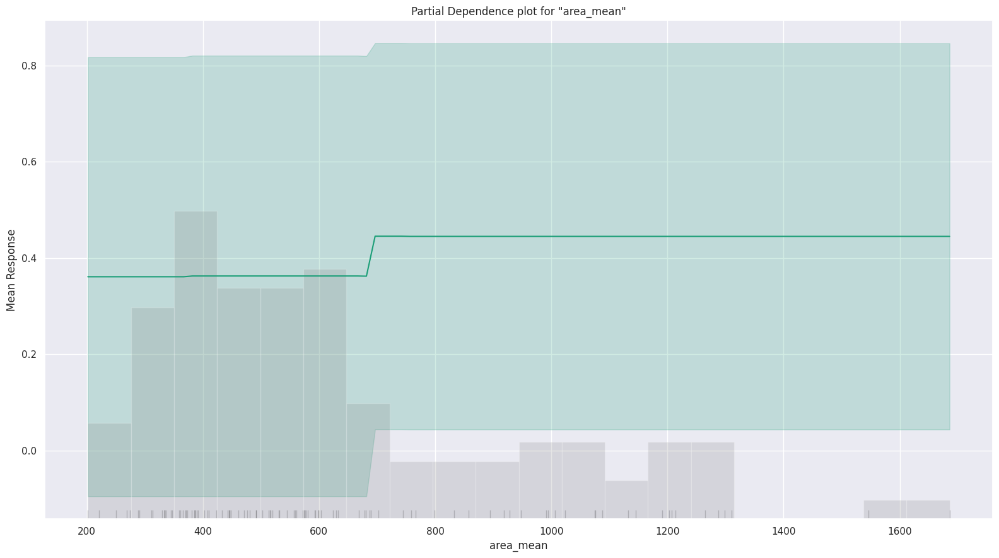

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

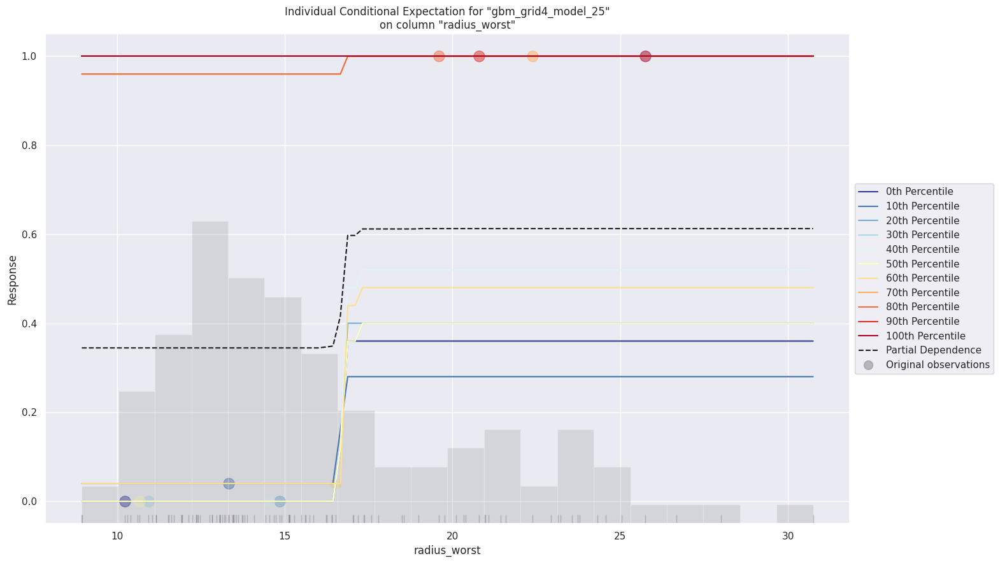

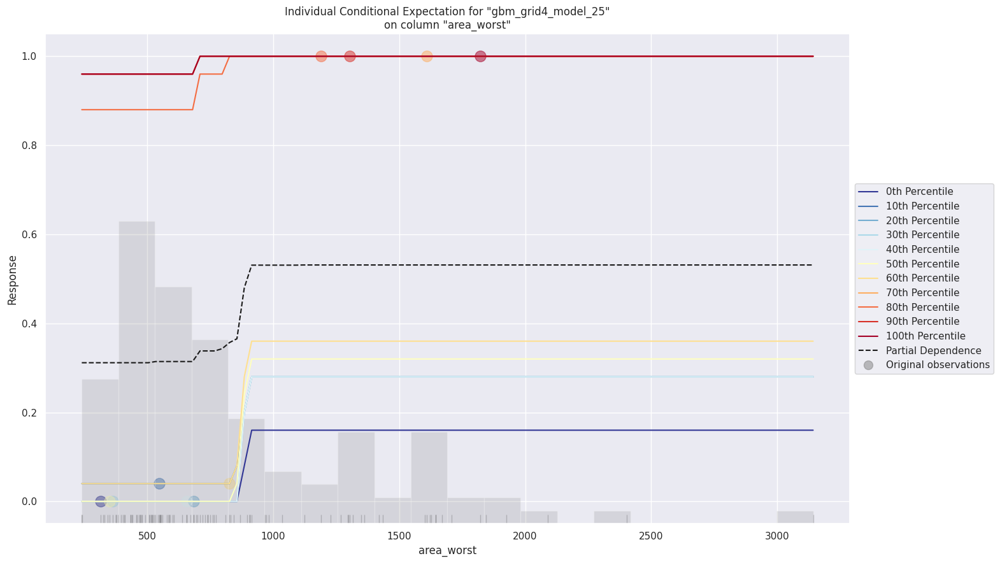

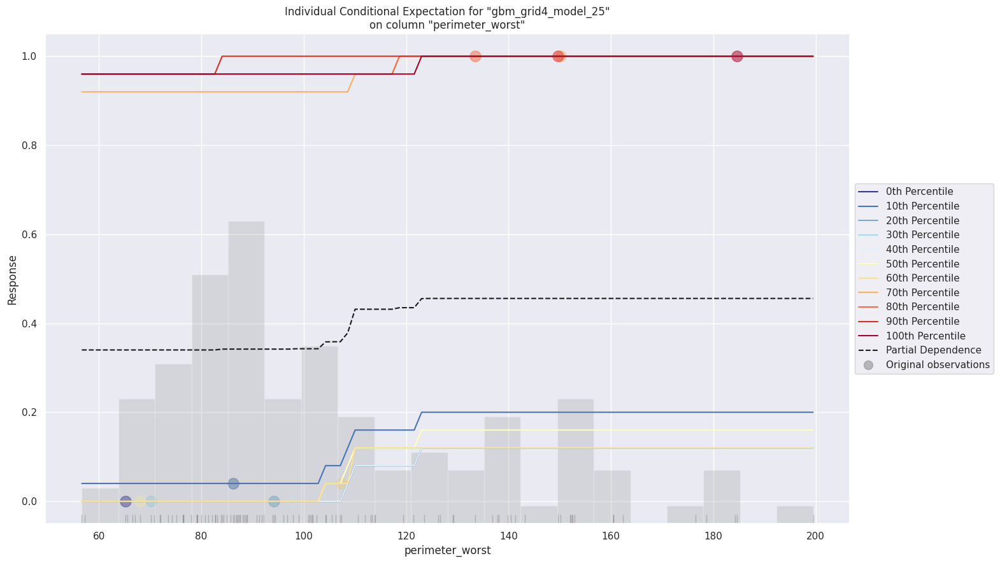

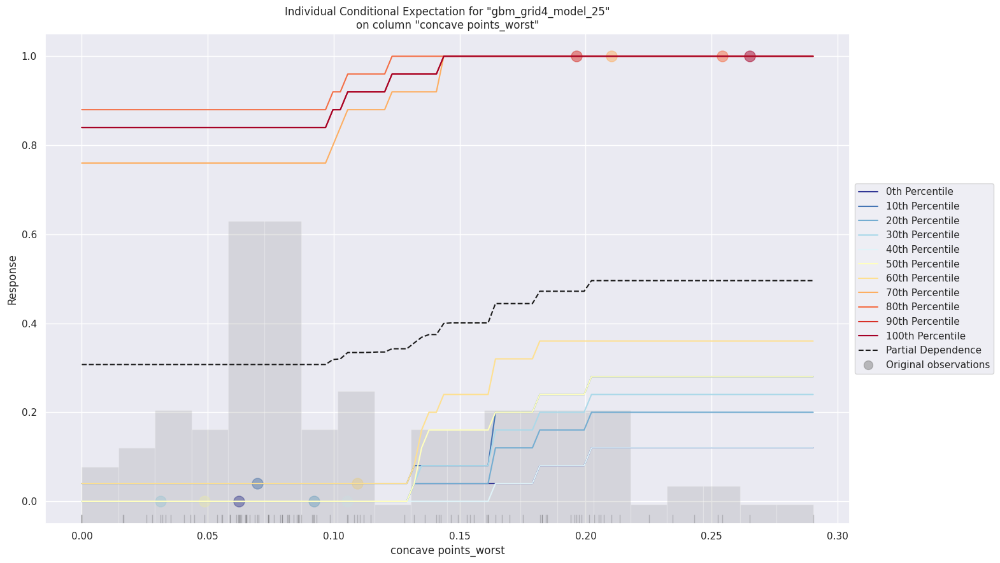

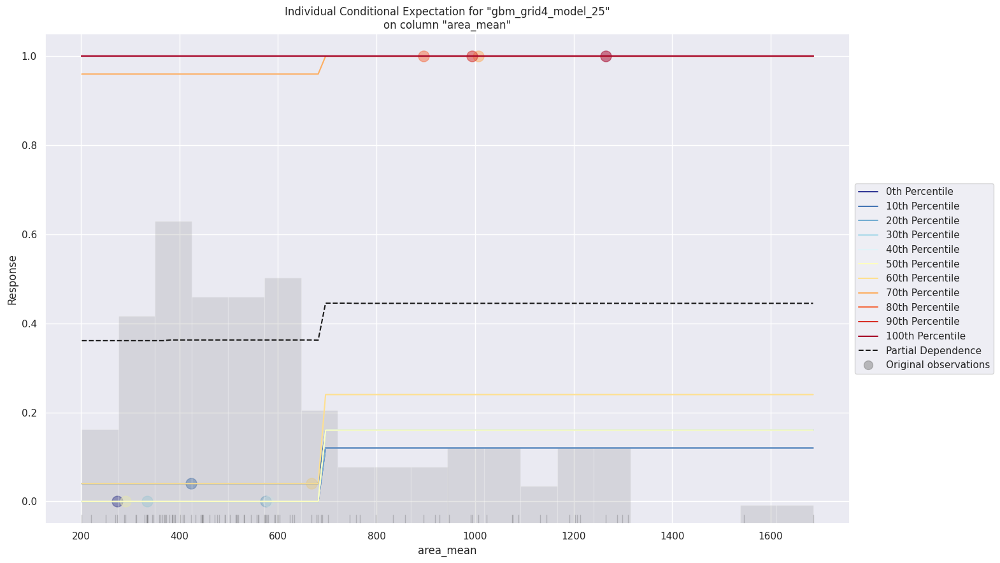

In [100]:
best_model.explain(autoML[1])  # AutoML Explainability

# **How are errors/residuals distributed and how interpretable is your model ?**

### **Residual Analysis**
In this analysis, the presence of striped lines in the residual plot is noted, which typically results from using integer response values rather than continuous ones. The distribution of the residuals appears to be normal based on the graph. The visuals indicate an absence of heteroscedasticity, as evidenced by the striped pattern and the lack of a cone-shaped spread in the residual plot.

### **Variable Importance**
The variable importance plot reflects the findings previously observed in both the Linear Model and Tree-Based Model. This consistency highlights the influential variables as identified across different modeling approaches.

### **SHAP Summary**
From the SHAP summary diagram, we can interpret a few conclusions -

1. The features are ranked based on their significance in influencing the prediction.

2. The SHAP value axis placement reveals the extent of a feature's impact on the prediction, either positive or negative. Greater distances from the SHAP value of 0.0 indicate more substantial effects. The color coding (Red for high impact and Blue for low impact) further illustrates how significantly each value affects the outcome.

3. FThis visualization allows us to deduce that an increase in concave_points_mean correlates with a higher likelihood of the disease.

4. Analyzing the SHAP value distribution for this feature shows that values at either extreme can greatly influence disease prediction, as evident in the SHAP plot.

5. SHAP analysis offers an advantage over traditional feature importance metrics by providing insights into how features affect the target across different values, whereas standard methods may overvalue features that are continuous or have high cardinality.


### **Partial Dependence Plot (PDP)**
A partial dependence plot illustrates the isolated effect of a specific feature on the predicted outcome (diagnosis in our dataset). This effect is determined by varying the feature of interest while holding all other features constant, thereby revealing the feature’s marginal impact on the target variable.

### **ICE (Individual Conditional Expectation) Plot**

An ICE plot is somewhat akin to the Partial Dependence Plot (PDP), yet there's a key distinction. While PDP concentrates on the average influence of a feature across the dataset, an ICE plot evaluates the effect of a feature on each individual instance. This method overcomes a limitation of PDPs by incorporating the variability across all observations instead of just an average impact.

In an ICE plot, each line represents the predicted outcome for a single instance as the value of a specific predictor varies, providing a detailed view of how the relationship between the predictor and the response varies among individual cases.

For instance, the ICE plot demonstrates that the diagnosis outcome (target variable) for some data points (e.g., those at the 0th percentile) remains steady initially before decreasing, whereas for others (e.g., those at the 100th percentile), it shows little change throughout.

ICE plots offer a more granular and intuitive depiction of how changing a specific feature impacts predictions for individual instances, compared to the more generalized insights from PDPs. Each line in an ICE plot corresponds to the predictive trajectory of a single instance when the feature of interest is varied.
















### **Observations**
- The top-performing model from AutoML, enhanced through hyperparameter tuning, stands out as the most effective for this task, achieving an unparalleled accuracy rate of 100% compared to other models evaluated during this exercise.
Furthermore, this model offers interpretability, allowing for an in-depth analysis of the underlying factors that influence its predictions.


### **Learning Outcomes**

- The experiments conducted yielded impressive results, demonstrating high Accuracy and Precision across the models tested.
- Engaging with the full spectrum of a Data Science project—from data preparation through to hyperparameter tuning—has enriched my experience and knowledge, as evidenced by previous assignments.

- A significant portion of effort should be dedicated to data preparation, encompassing tasks such as cleaning, normalizing, selecting features, and implementing imputation techniques.

- Analysis of feature importance highlighted that certain attributes, like radius_worst and perimeter_mean, play critical roles in predicting Breast Cancer Disease.

- Model Interpretation is the best takeaway from the series of these assignments. SHAP, LIME and PDP have made it easier to understand what made a model to predict a outcome.

Overall, this project showcased the effectiveness of machine learning methods in forecasting **Breast Cancer Disease** and emphasized the crucial role of meticulous data handling and model analysis in enhancing predictive accuracy. The insights gained could be instrumental in advancing early detection and treatment strategies for **Breast Cancer Disease**, potentially improving outcomes for patients.





#**Learning Outcomes**

- The outcomes of the experiments demonstrated encouraging predictive performance, with the models achieving notable levels of accuracy and precision.

- Engaging with the entire lifecycle of a Data Science project, spanning from data preparation to hyperparameter tuning, has been a valuable learning experience from previous assignments.

- A significant portion of effort should be allocated to data preparation tasks, including data cleaning, normalization, feature selection, and imputation.

- Analysis of feature importance highlighted specific key attributes, such as **radius_worst** and **perimeter_mean**, as significant factors in predicting Breast Cancer Disease.

- Through rigorous model evaluation and comparison, the most effective model for predicting Breast Cancer Disease could be identified.

- The ability to interpret models stands out as a key takeaway from this series of assignments. Techniques like SHAP, LIME, and PDP have facilitated a deeper understanding of the factors influencing model predictions.



#  **Citations**

1.Many techniques used in this notebook have been adopted from the following github repositories

Owner - AI Skunkworks
Link - https://github.com/aiskunks/Skunks_Skool

Author name - Prof Nik Bear Brown
Link - https://github.com/nikbearbrown/

2.Automated Machine Learning with H20
Link - https://towardsdatascience.com/automated-machine-learning-with-h2o-258a2f3a203f

3.Explain Your Model with the SHAP Values
Link - https://medium.com/dataman-in-ai/explain-your-model-with-the-shap-values-bc36aac4de3d

4.Interpretability Methods in Machine Learning: A Brief Survey
Link- https://www.twosigma.com/articles/interpretability-methods-in-machine-learning-a-brief-survey/

#MIT License

Copyright (c) 2024 someshBanerjee

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.